# Imports

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import matplotlib.pyplot as plt

In [3]:
import warnings
# warnings.filterwarnings(action='once')
warnings.filterwarnings('ignore')

In [4]:
import scanpy as sc
import pandas as pd
import numpy as np
from pathlib import Path


from drvi_notebooks.utils.data.adata_plot_pp import make_balanced_subsample
from drvi_notebooks.utils.data.data_configs import get_data_info
from drvi_notebooks.utils.run_info import get_run_info_for_dataset
from drvi_notebooks.utils.latent import set_optimal_ordering
from drvi_notebooks.utils.plotting import scatter_plot_per_latent

In [5]:
sc.set_figure_params(vector_friendly=True, dpi_save=300)

In [6]:
import mplscience
mplscience.available_styles()
mplscience.set_style()

['default', 'despine']


# Config

In [7]:
cwd = os.getcwd()
cwd

'/ictstr01/home/icb/amirali.moinfar/projects/drvi_reproducibility_public/drvi_notebooks/analysis'

In [8]:
proj_dir = Path(cwd).parent.parent
proj_dir

PosixPath('/ictstr01/home/icb/amirali.moinfar/projects/drvi_reproducibility_public')

In [9]:
(proj_dir / 'plots' / 'immune_ablation_all_genes').mkdir(parents=True, exist_ok=True)

In [10]:
logs_dir = Path(os.path.expanduser('~/workspace/train_logs'))
logs_dir

PosixPath('/home/icb/amirali.moinfar/workspace/train_logs')

In [11]:
run_name = 'immune_all'
run_version = '4.3'
run_path = os.path.expanduser('~/workspace/train_logs/models')

data_info = get_data_info(run_name, run_version)
wandb_address = data_info['wandb_address']
col_mapping = data_info['col_mapping']
plot_columns = data_info['plot_columns']
pp_function = data_info['pp_function']
data_path = data_info['data_path']
var_gene_groups = data_info['var_gene_groups']
cell_type_key = data_info['cell_type_key']
exp_plot_pp = data_info['exp_plot_pp']
control_treatment_key = data_info['control_treatment_key']
condition_key = data_info['condition_key']
split_key = data_info['split_key']

In [12]:
cat_10_pallete = sc.plotting.palettes.vega_10_scanpy
cat_10_pallete_without_grey = [c for c in cat_10_pallete if c != '#7f7f7f']
cat_20_pallete = sc.plotting.palettes.vega_20_scanpy
wong_pallete = [
    "#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7", "#000000",
]
cat_100_pallete = sc.plotting.palettes.godsnot_102

## Data

In [13]:
adata = sc.read(data_path)
adata

AnnData object with n_obs × n_vars = 32484 × 12303
    obs: 'batch', 'chemistry', 'data_type', 'dpt_pseudotime', 'final_annotation', 'mt_frac', 'n_counts', 'n_genes', 'sample_ID', 'size_factors', 'species', 'study', 'tissue'
    var: 'hvg', 'gene_de_sig', 'mean', 'std'
    uns: 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'lognorm'
    obsp: 'connectivities', 'distances'

## Runs to load

In [14]:
run_info = get_run_info_for_dataset('immune_all_hbw_ablation')
RUNS_TO_LOAD = run_info.run_dirs
scatter_point_size = run_info.scatter_point_size
adata_to_transfer_obs = run_info.adata_to_transfer_obs

for k,v in RUNS_TO_LOAD.items():
    if not os.path.exists(v):
        raise ValueError(f"{v} does not exists.")

In [15]:
embeds = {}
random_order = None
for method_name, run_path in RUNS_TO_LOAD.items():
    print(method_name)
    embed = sc.read(run_path / 'latent.h5ad')
    pp_function(embed)
    set_optimal_ordering(embed, key_added='optimal_var_order')    
    if random_order is None:
        random_order = embed.obs.sample(frac=1.).index
    embed = embed[random_order].copy()
    embeds[method_name] = embed

2 Dimensional
4 Dimensional
6 Dimensional
8 Dimensional
10 Dimensional
12 Dimensional
14 Dimensional
16 Dimensional
32 Dimensional
64 Dimensional
128 Dimensional
256 Dimensional
512 Dimensional
1024 Dimensional
2048 Dimensional


In [16]:
# bad umap from rapids-single-cell on 2D emb
embed = embeds['2 Dimensional']
sc.pp.neighbors(embed, use_rep="qz_mean", n_neighbors=10, n_pcs=embed.obsm["qz_mean"].shape[1])
sc.tl.umap(embed, spread=1.0, min_dist=0.5, random_state=123)
sc.tl.pca(embed)

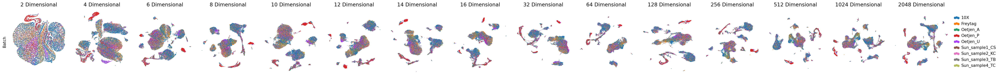

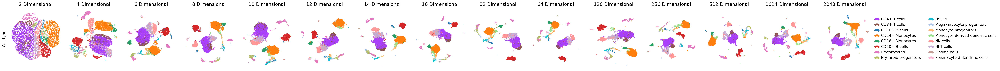

In [17]:
size = 3

for _, col in enumerate(plot_columns):
    fig,axs=plt.subplots(1, len(embeds),
                     figsize=(len(embeds) * size, 1 * size),
                     sharey='row', squeeze=False)
    j = 0
    for i, (method_name, embed) in enumerate(embeds.items()):
    
        pos = (-0.1, 0.5)
        
        ax = axs[j, i]
        unique_values = list(sorted(list(embed.obs[col].astype(str).unique())))
        # if len(unique_values) <= 8:
        #     palette = dict(zip(unique_values, wong_pallete))
        if len(unique_values) <= 10:
            palette = dict(zip(unique_values, cat_10_pallete))
        elif len(unique_values) <= 20:
            palette = dict(zip(unique_values, cat_20_pallete))
        elif len(unique_values) <= 102:
            palette = dict(zip(unique_values, cat_100_pallete))
        else:
            palette = None
        sc.pl.embedding(embed, 'X_umap',
                        color=col, 
                        palette=palette, 
                        ax=ax, show=False, frameon=False, title='' if j != 0 else method_name, 
                        legend_loc='none' if i != len(embeds) - 1 else 'right margin',
                        colorbar_loc=None if i != len(embeds) - 1 else 'right')
        if i == 0:
            ax.annotate(col_mapping[col], zorder=100, fontsize=12,
                        xy=pos, xytext=pos, textcoords='axes fraction', rotation='vertical', va='center', ha='center')

    plt.subplots_adjust(left=0.1,
                        bottom=0.05,
                        right=0.95,
                        top=0.95,
                        wspace=0.1,
                        hspace=0.1)   
    plt.savefig(proj_dir / 'plots' / 'immune_ablation_all_genes' / f'plot_{run_name}_umaps_{col}.pdf', bbox_inches='tight')

2 Dimensional


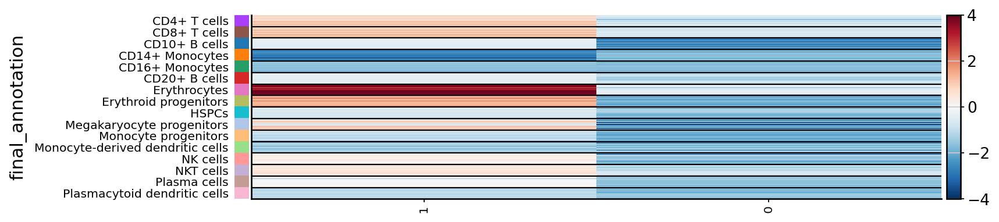

4 Dimensional


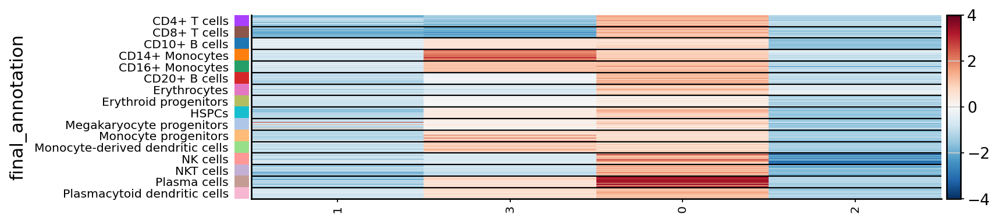

6 Dimensional


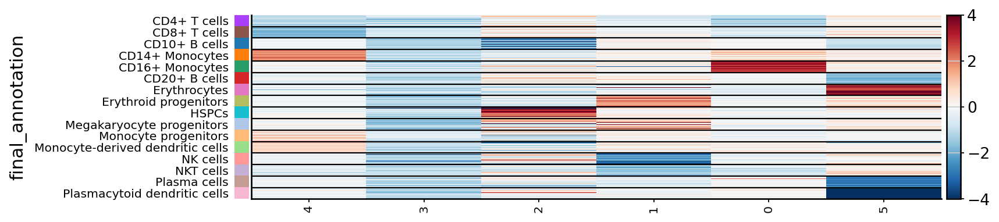

8 Dimensional


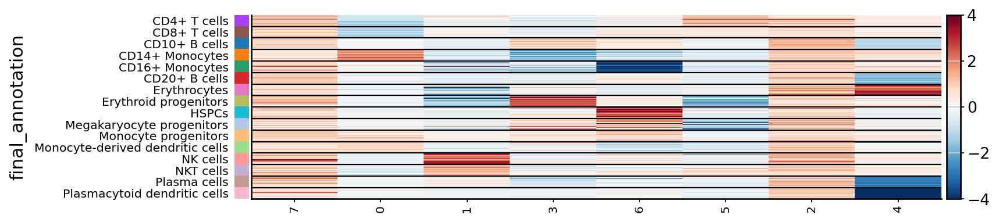

10 Dimensional


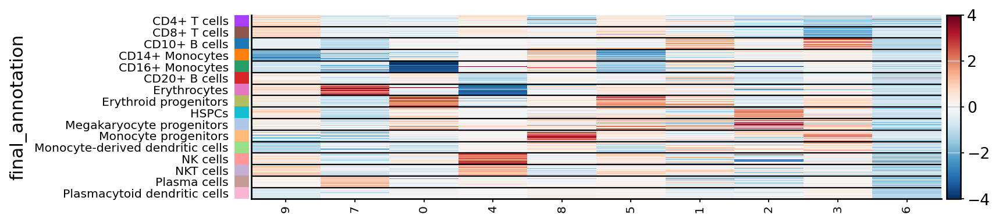

12 Dimensional


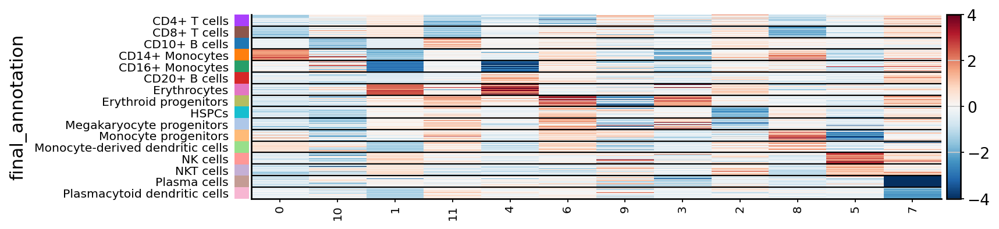

14 Dimensional


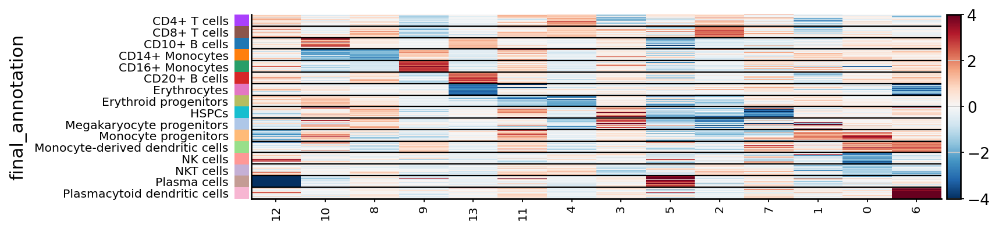

16 Dimensional


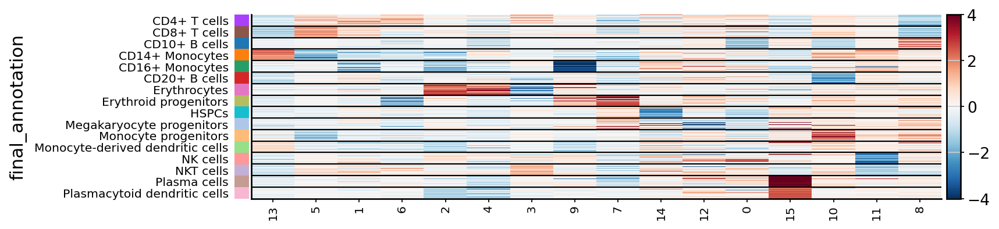

32 Dimensional


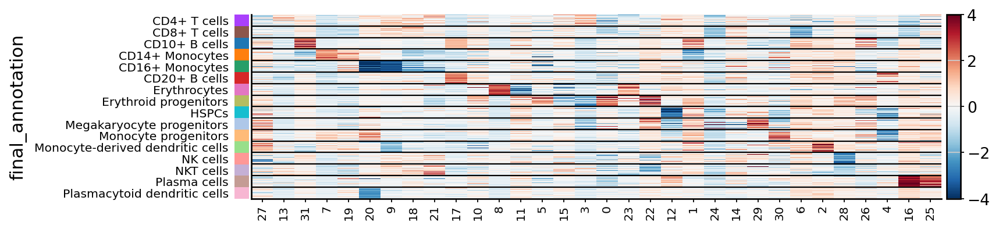

64 Dimensional


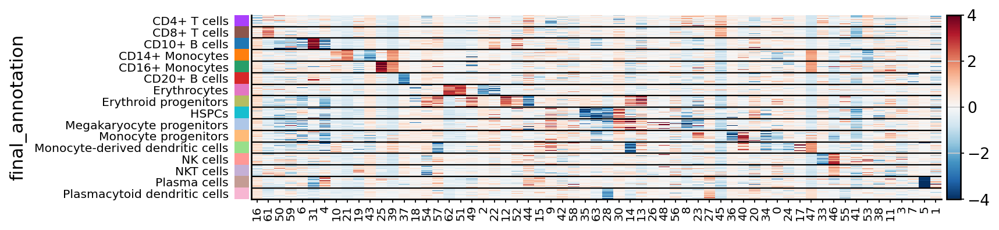

128 Dimensional


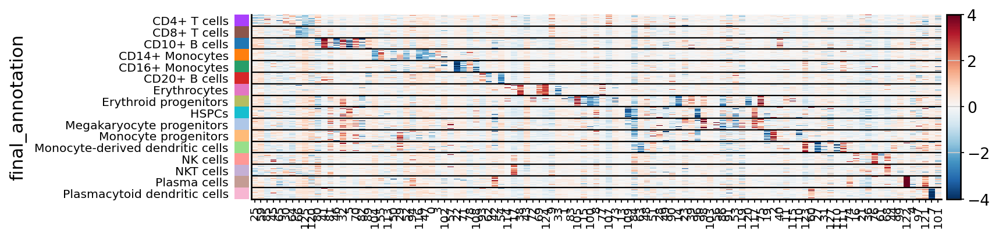

256 Dimensional


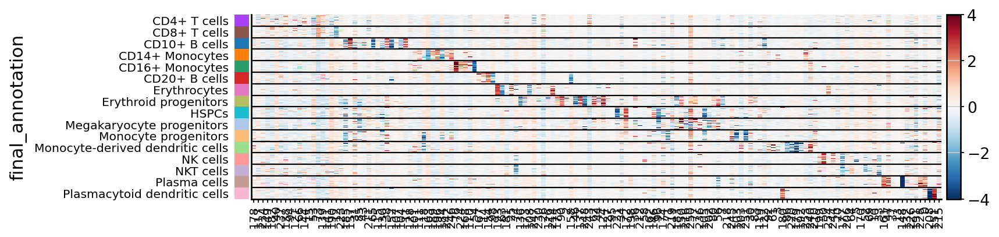

512 Dimensional


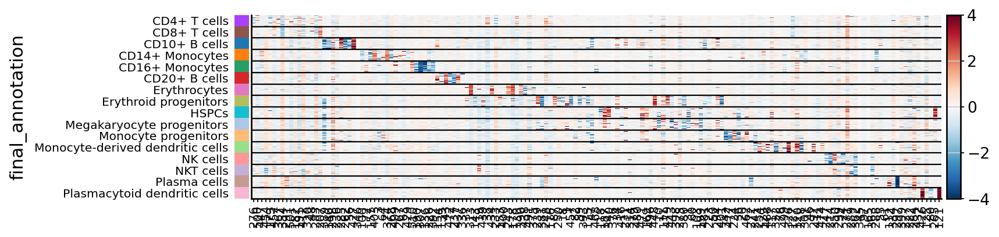

1024 Dimensional


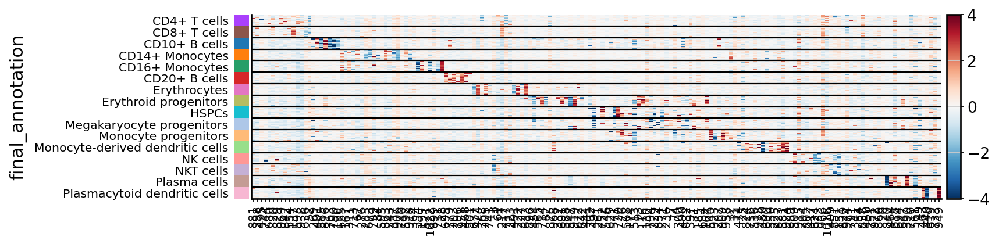

2048 Dimensional


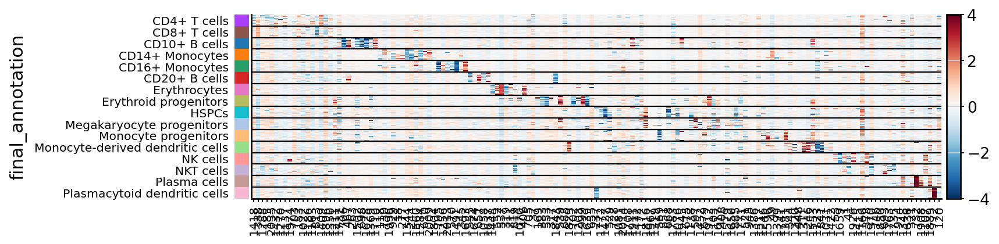

In [18]:
for method_name, embed in embeds.items():
    print(method_name)
    k = cell_type_key
    non_vanished_vars = np.arange(embed.n_vars)[np.abs(embed.X).max(axis=0) >= 0.1]
    embed_balanced = make_balanced_subsample(embed, k)
    dim_order = np.abs(embed_balanced.X).argmax(axis=0).argsort().tolist()
    sc.pl.heatmap(
        embed_balanced,
        embed.var.iloc[[x for x in dim_order if x in non_vanished_vars]].index,
        k,
        layer=None,
        figsize=(10, len(embed.obs[k].unique()) / 6),
        var_group_rotation=45,
        show_gene_labels=True,
        dendrogram=False,
        vcenter=0, vmin=-4, vmax=4,
        cmap='RdBu_r',
        show=False,
    )
    
    plt.savefig(proj_dir / 'plots' / 'immune_ablation_all_genes' / f'heatmap_of_non_vanished_dims_{k}_{method_name}.pdf', bbox_inches='tight')
    plt.show()

# Number of vanished dimensions

2 Dimensional


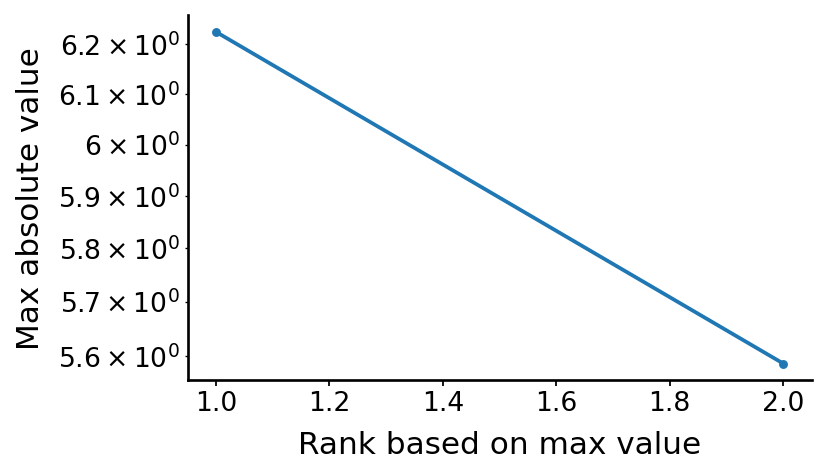

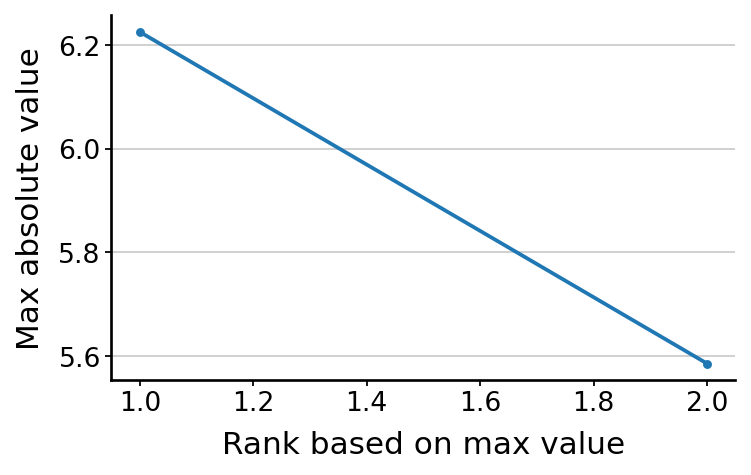

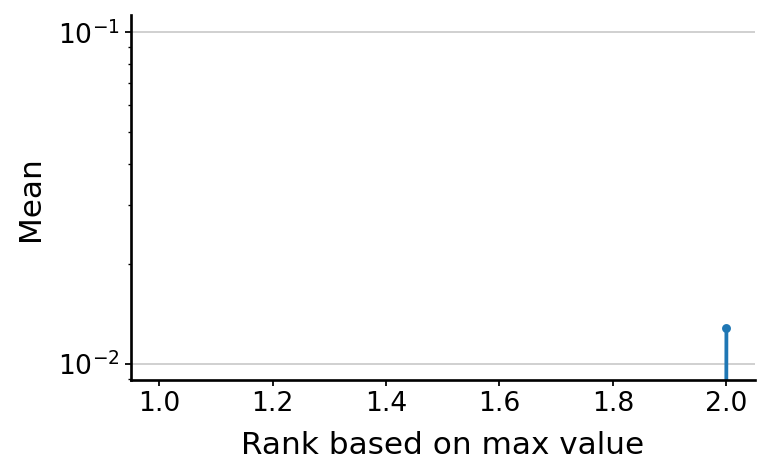

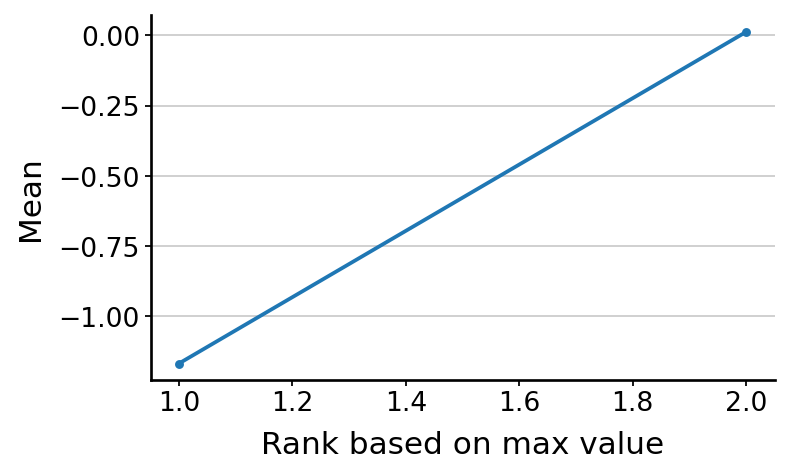

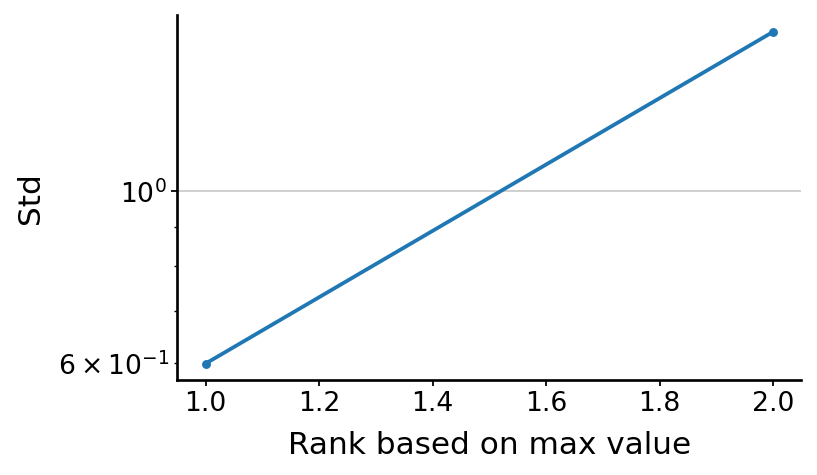

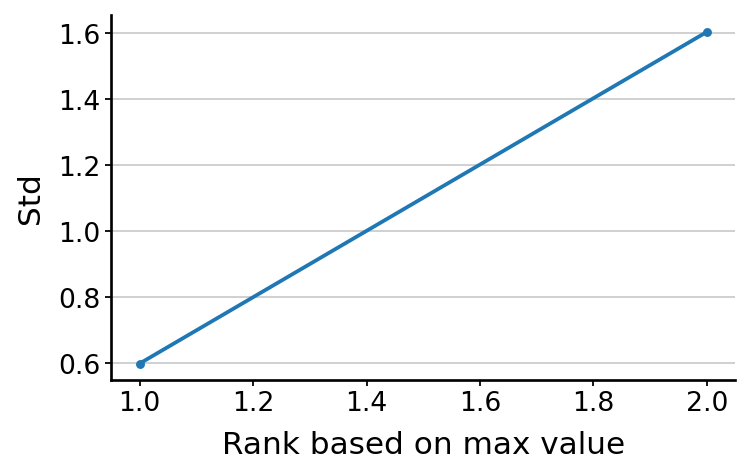

4 Dimensional


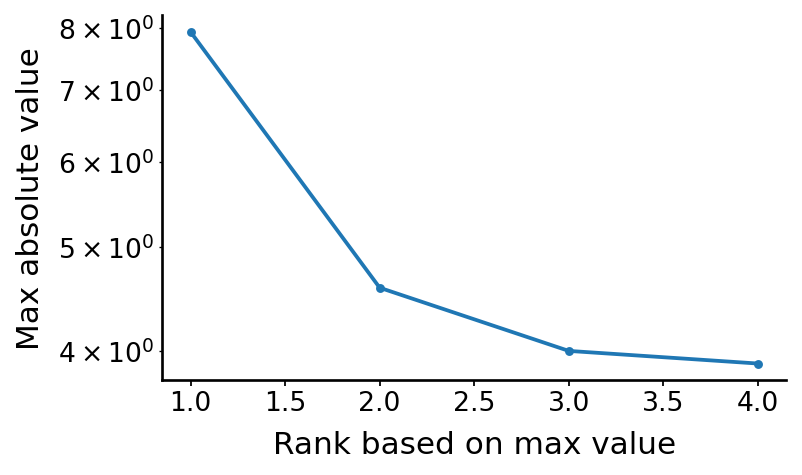

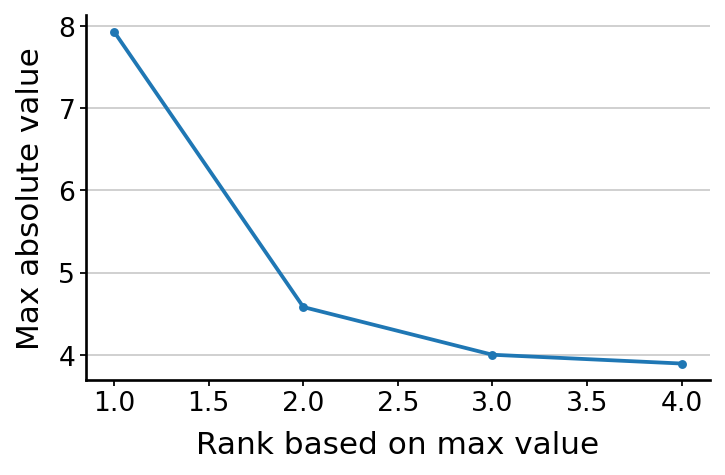

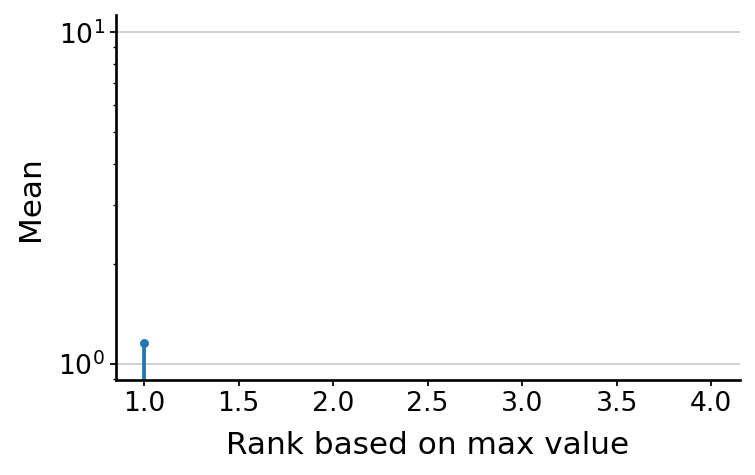

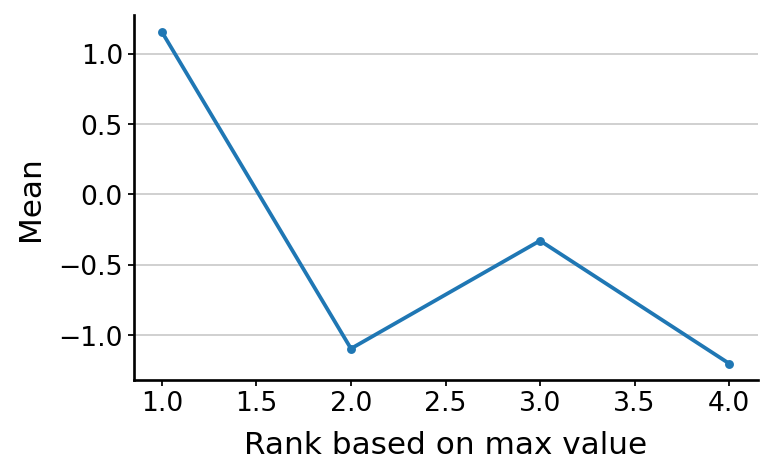

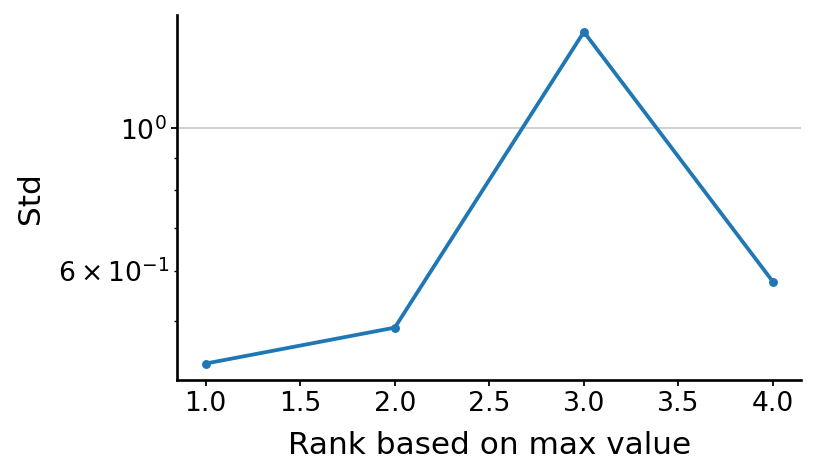

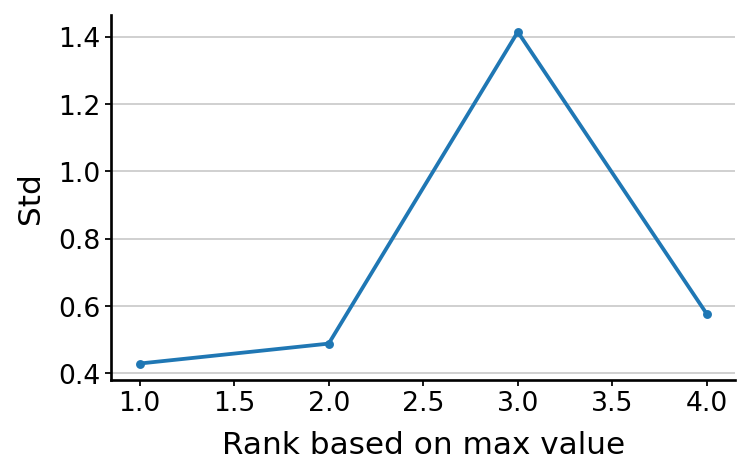

6 Dimensional


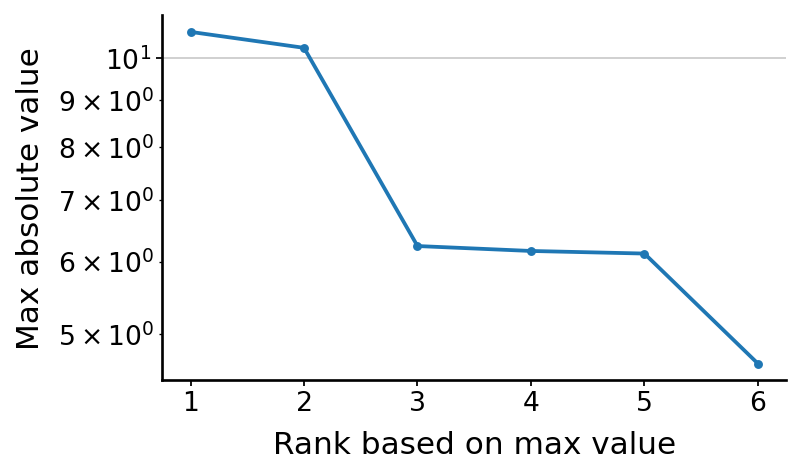

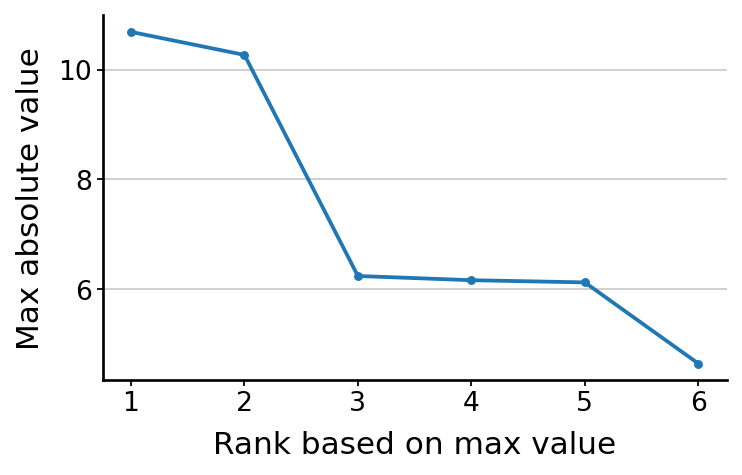

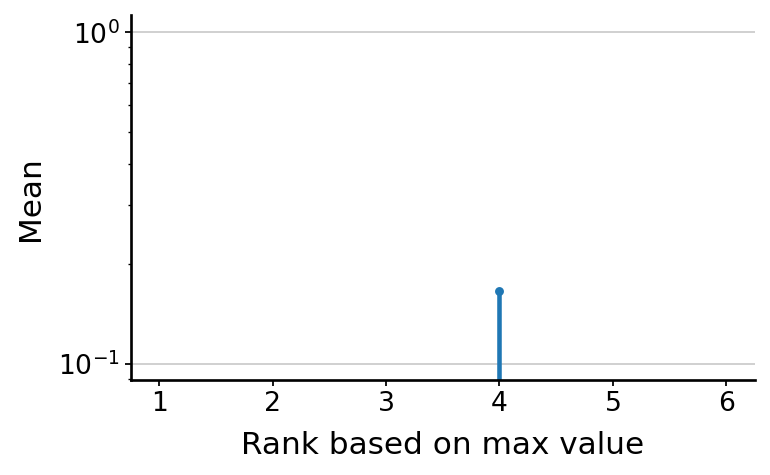

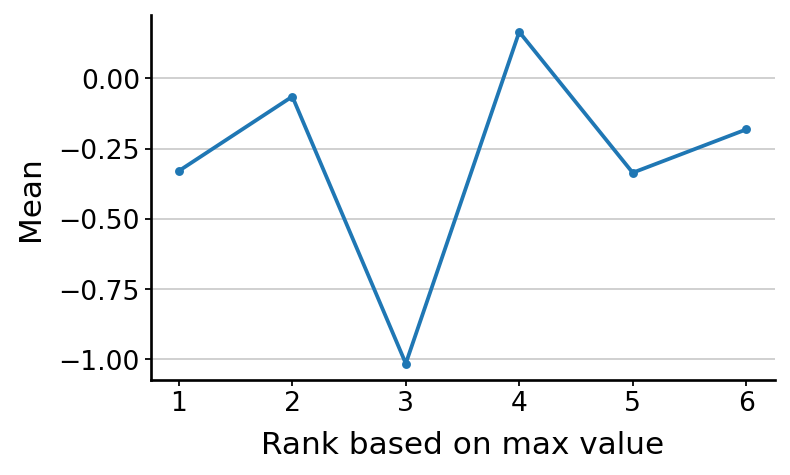

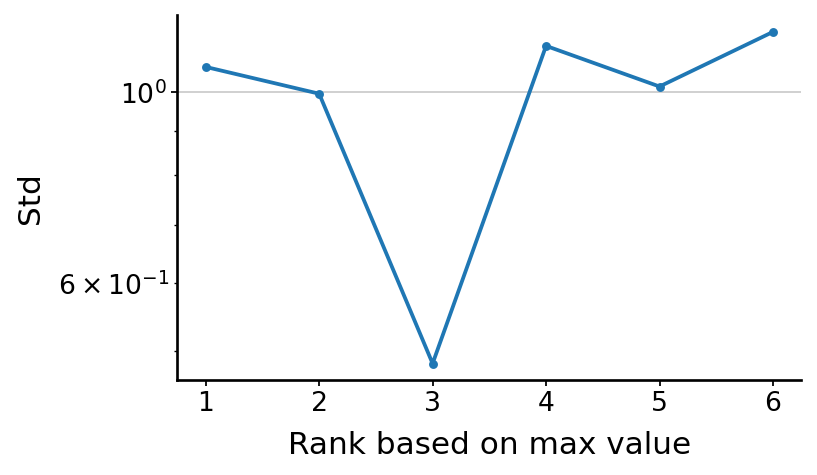

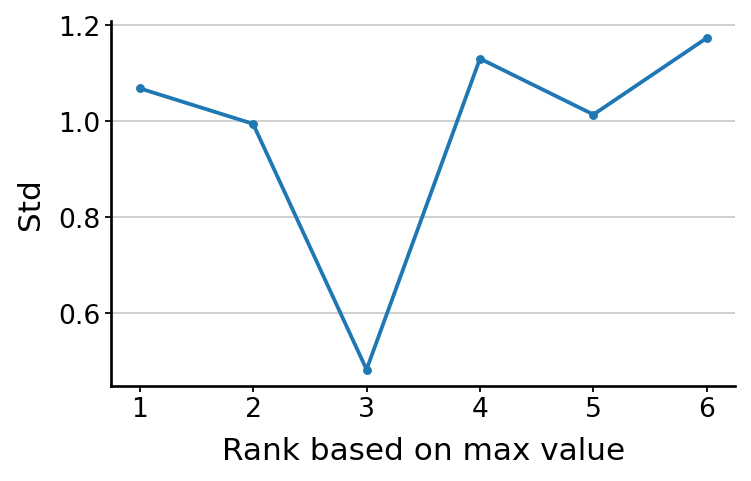

8 Dimensional


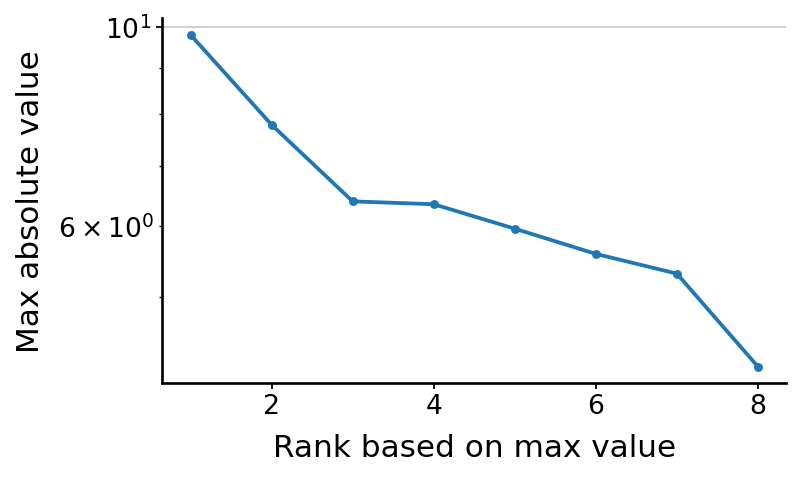

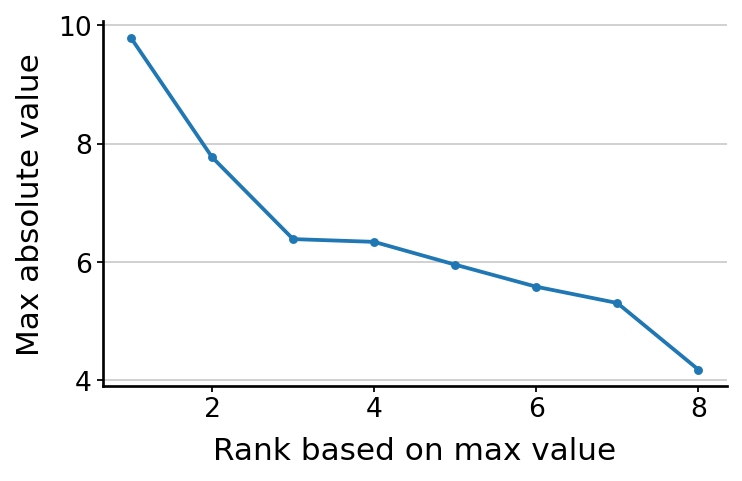

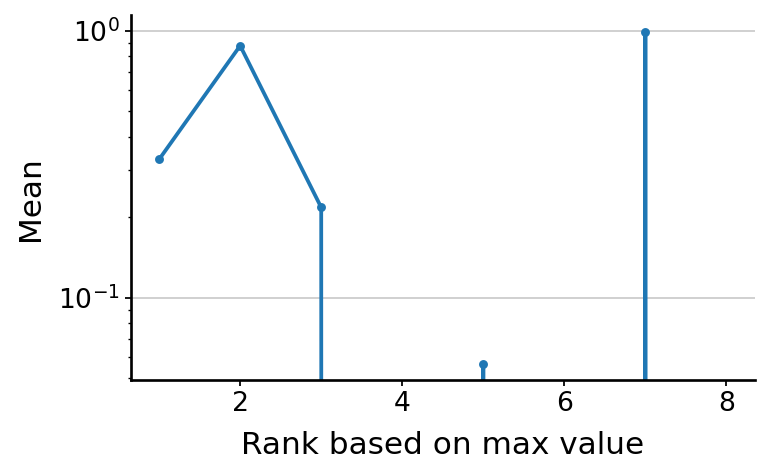

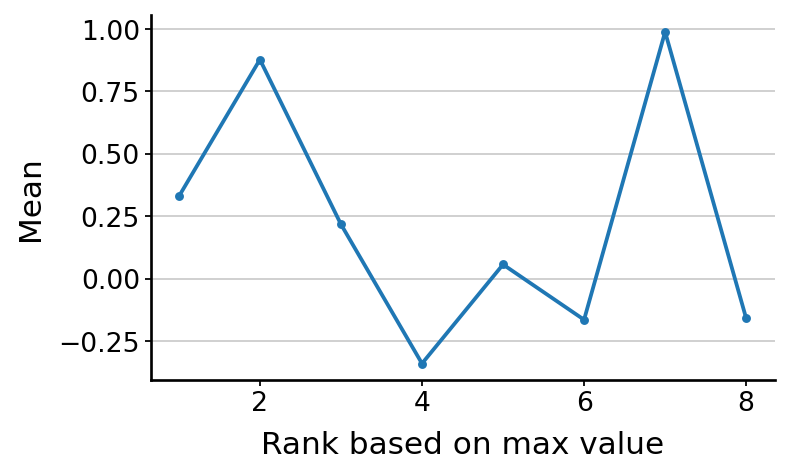

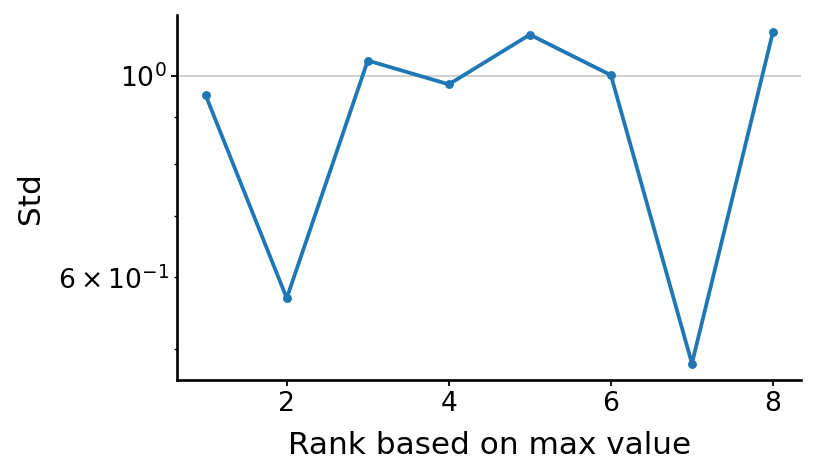

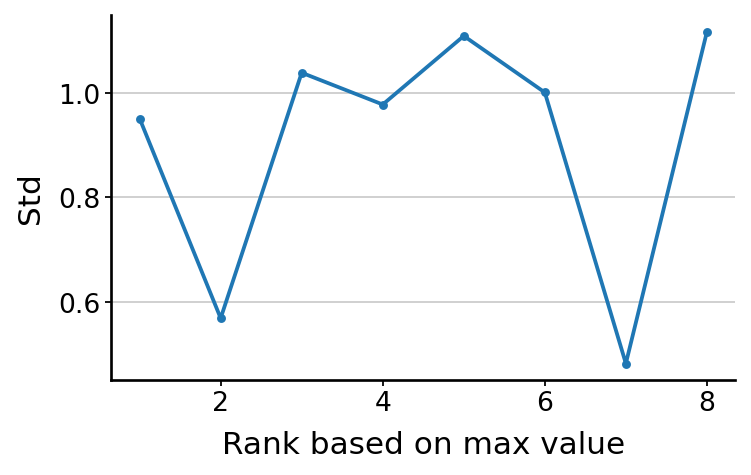

10 Dimensional


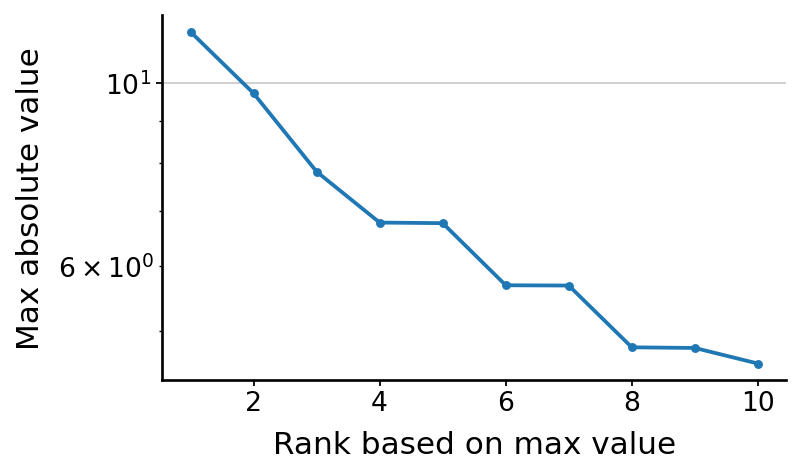

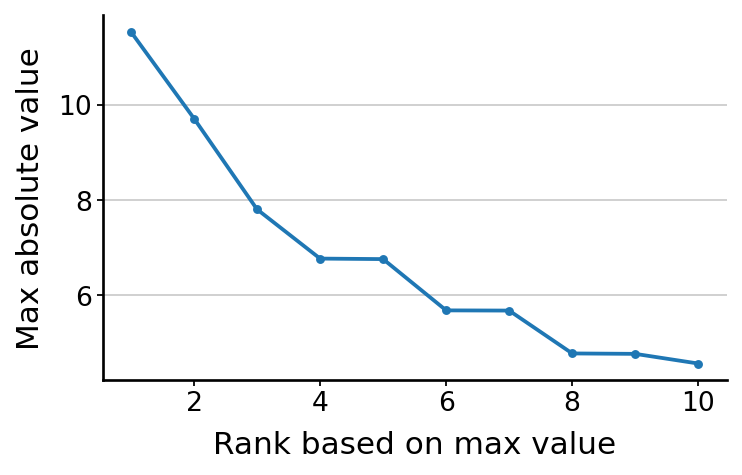

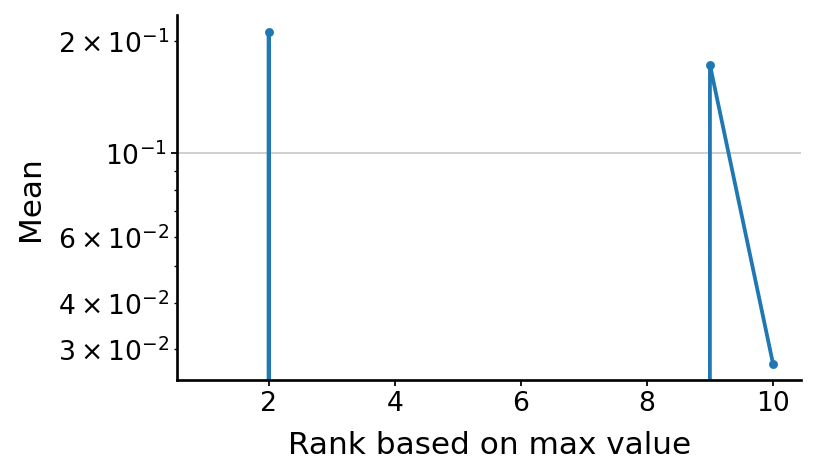

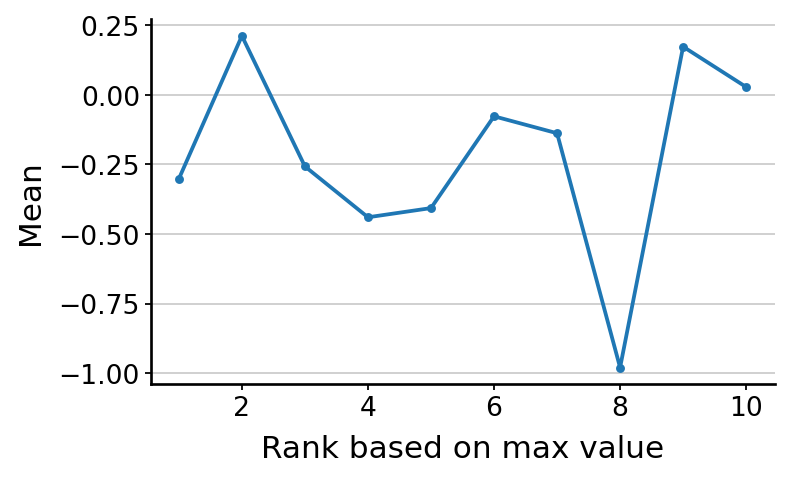

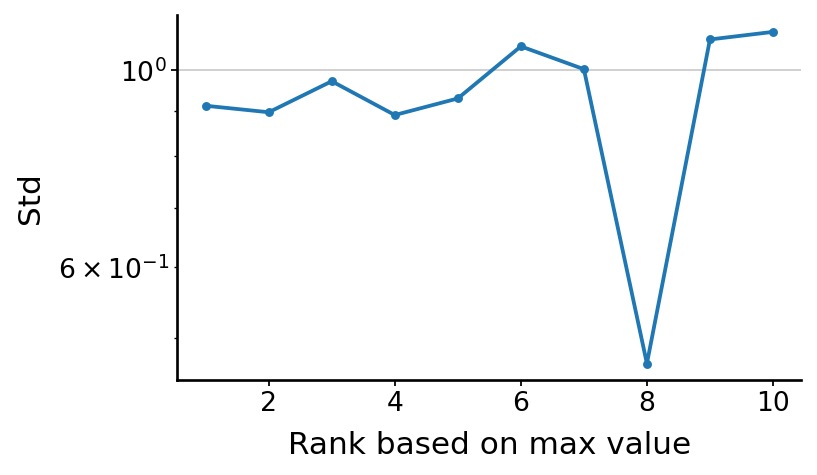

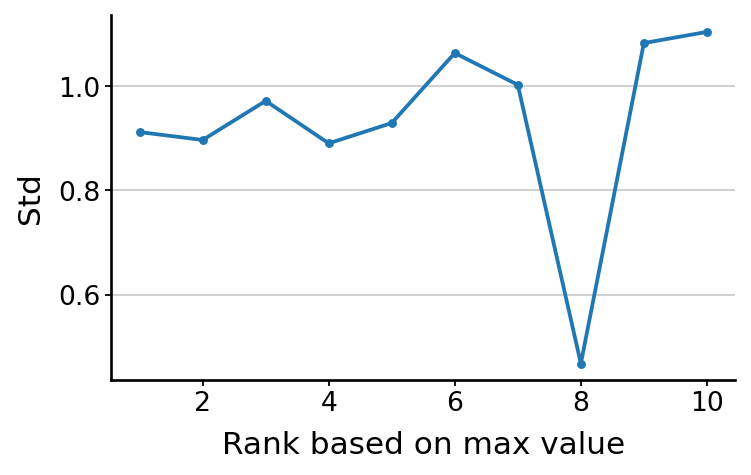

12 Dimensional


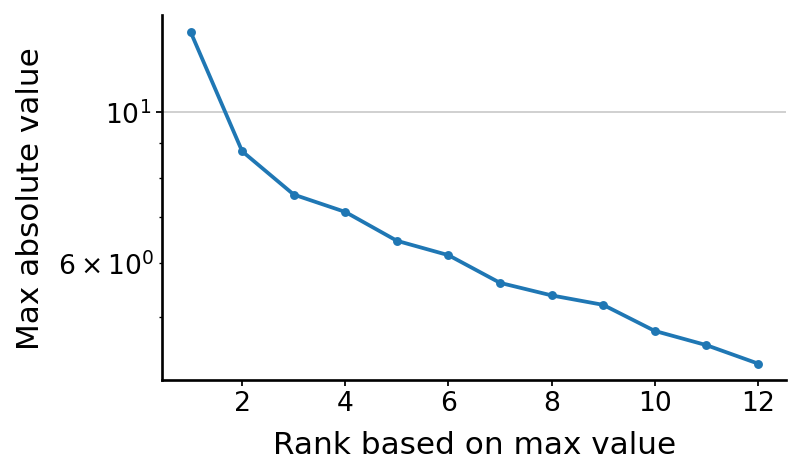

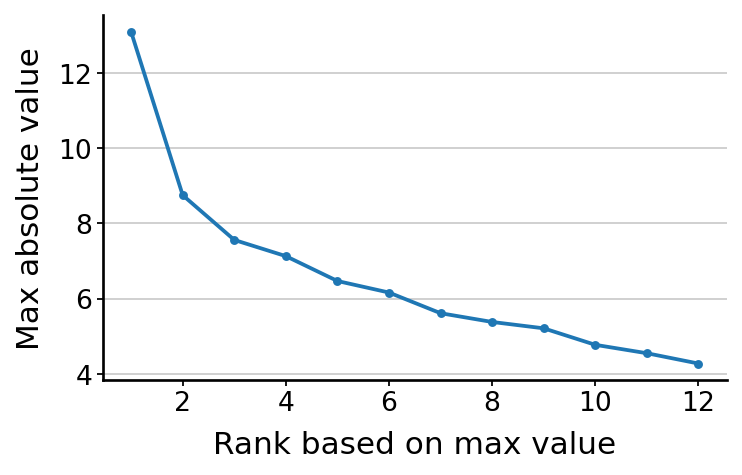

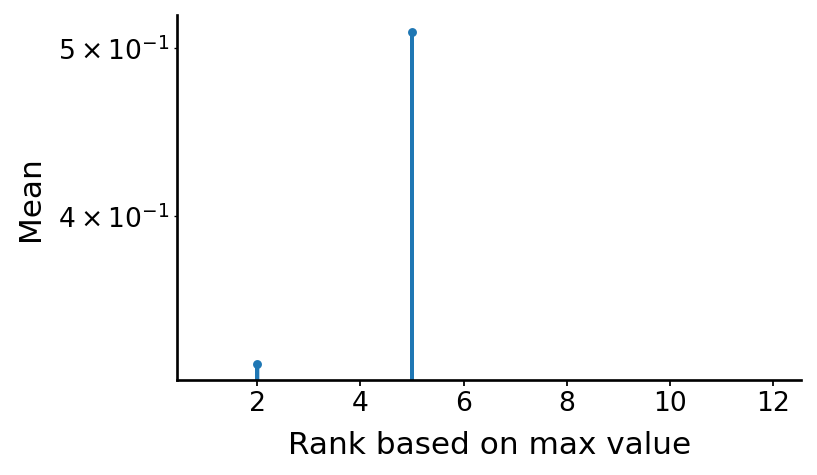

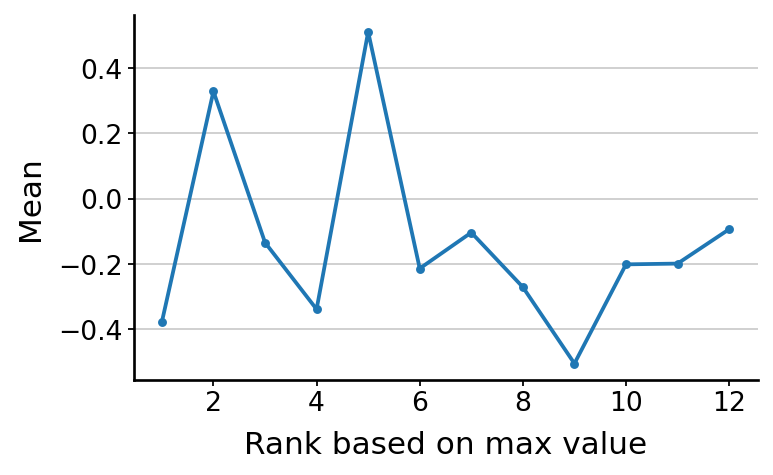

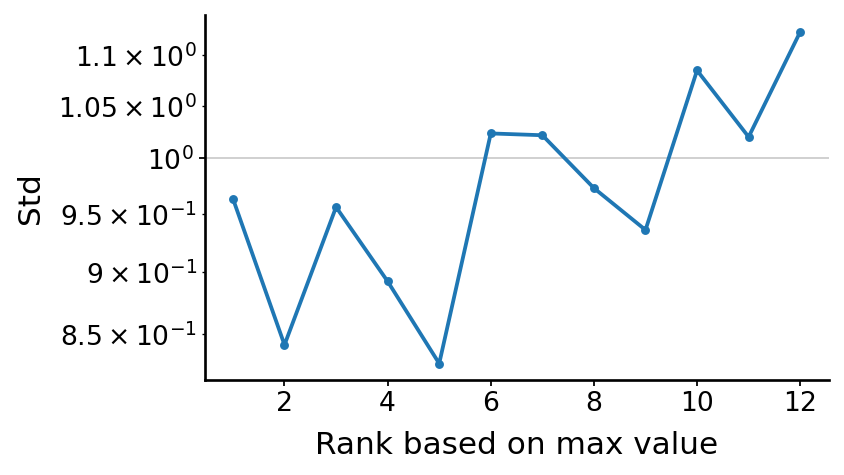

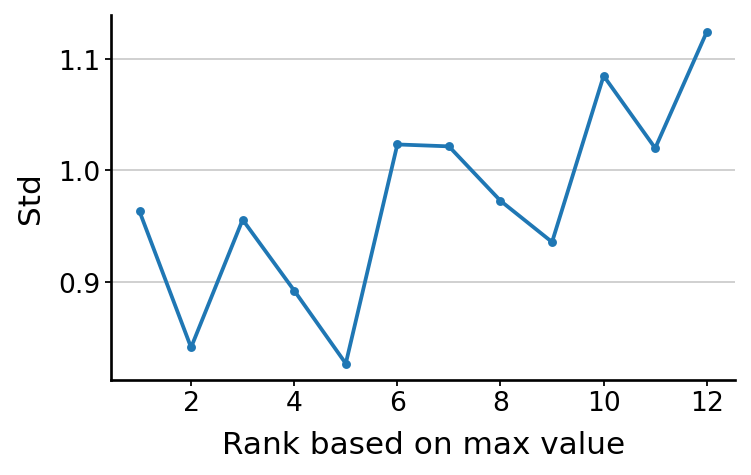

14 Dimensional


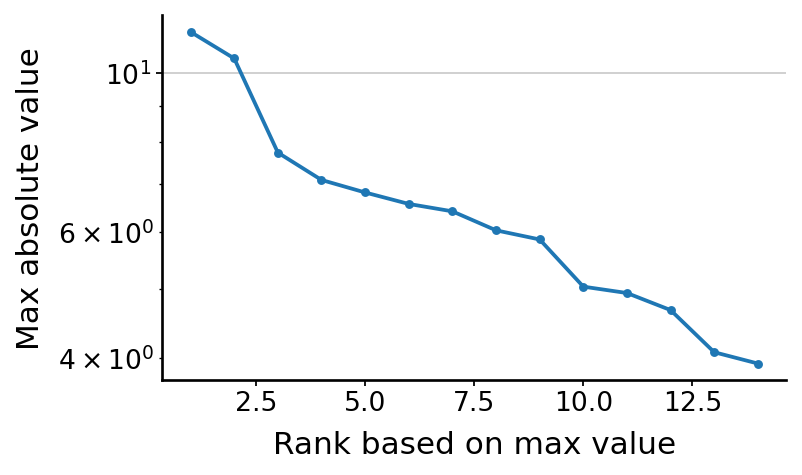

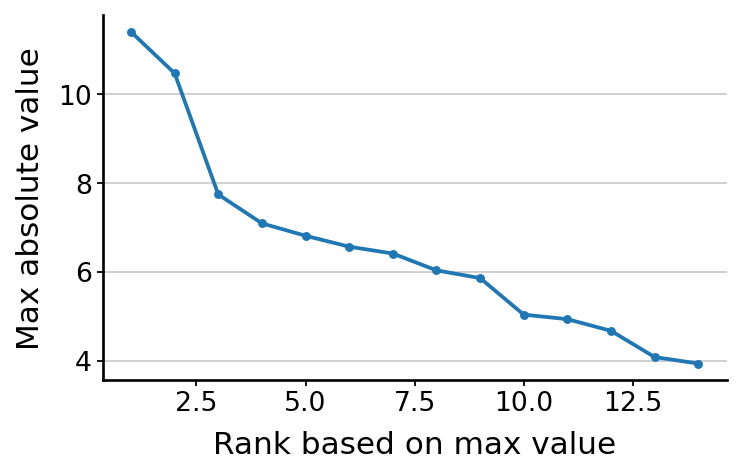

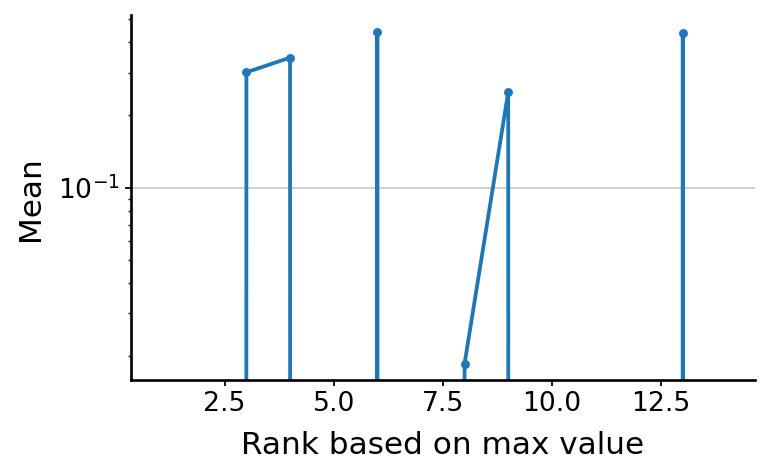

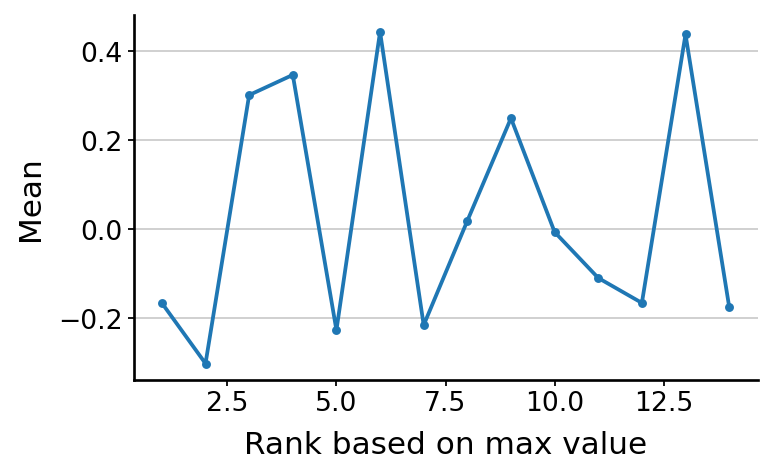

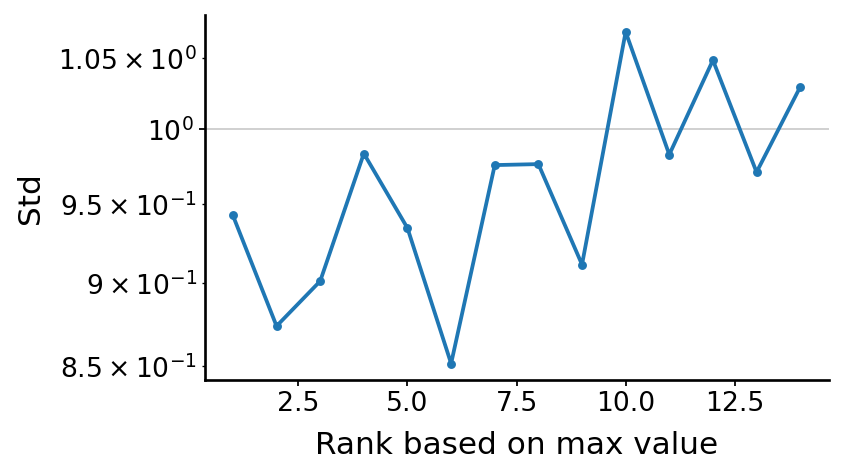

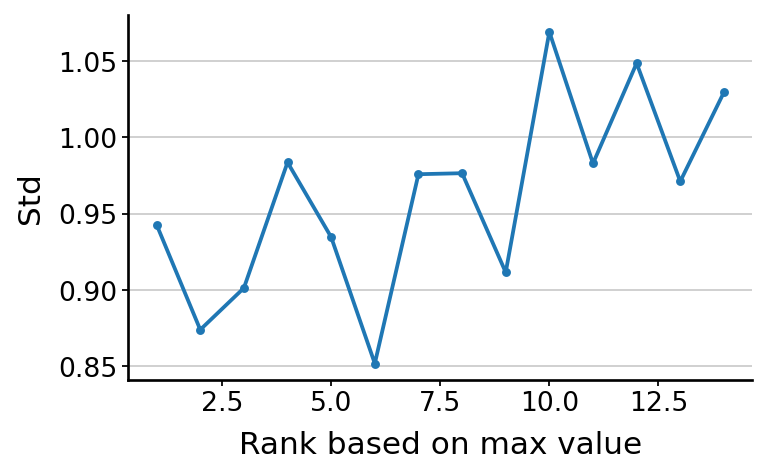

16 Dimensional


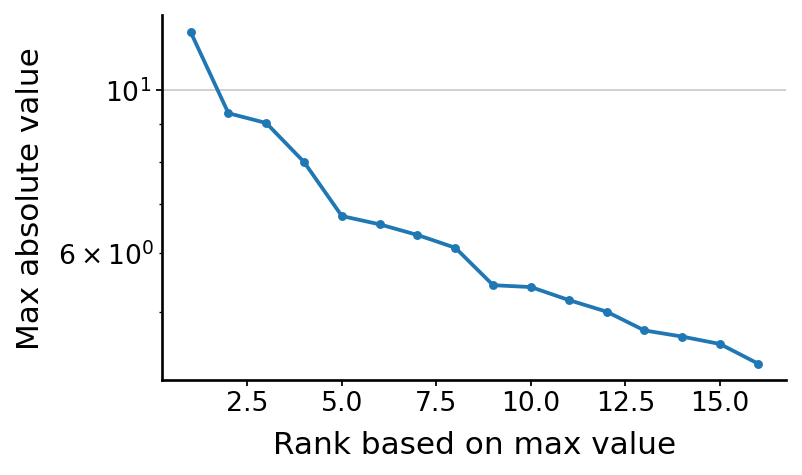

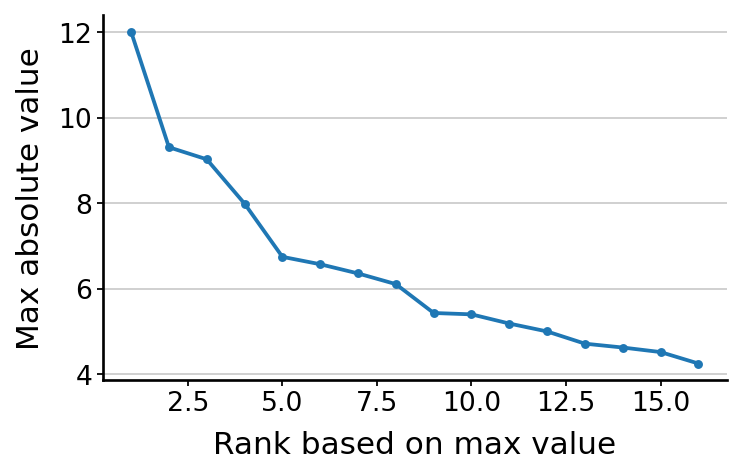

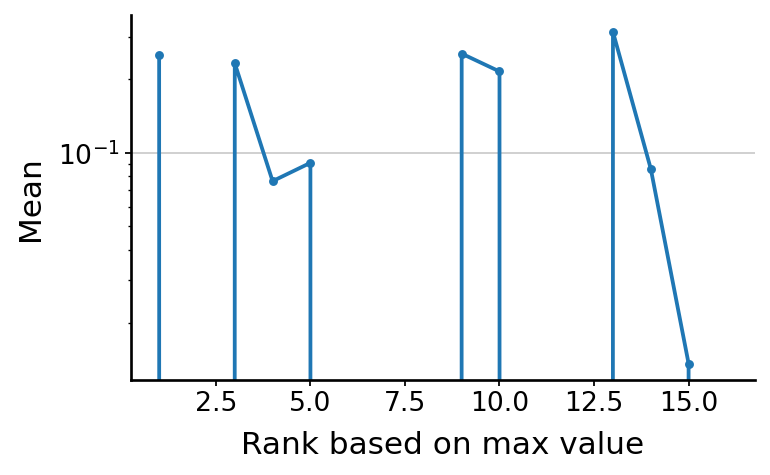

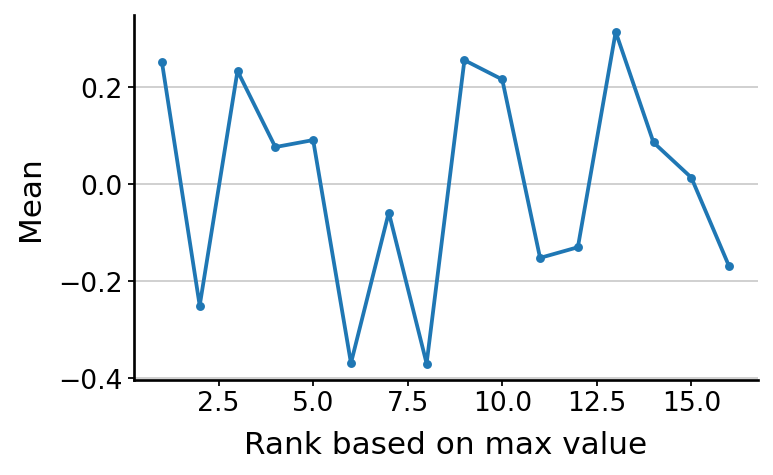

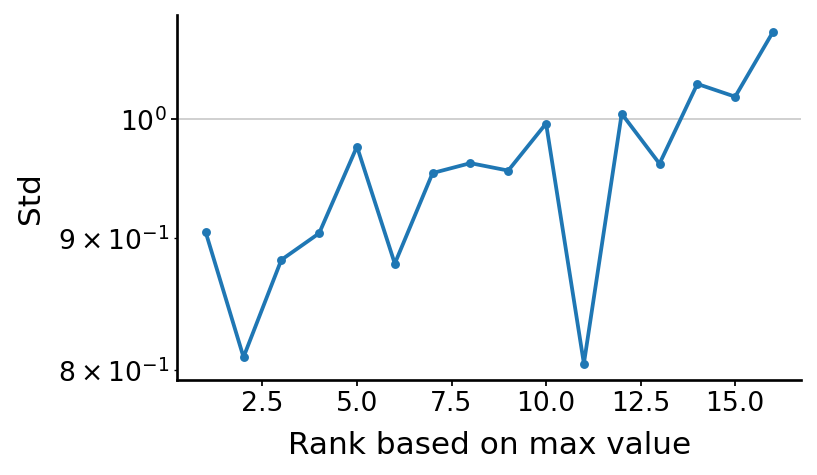

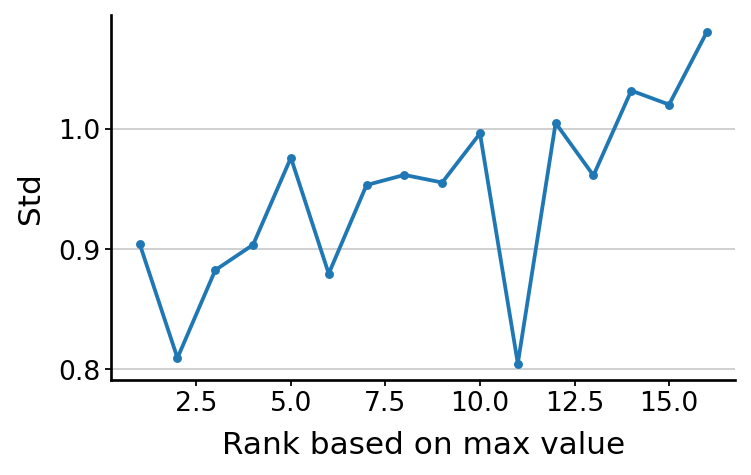

32 Dimensional


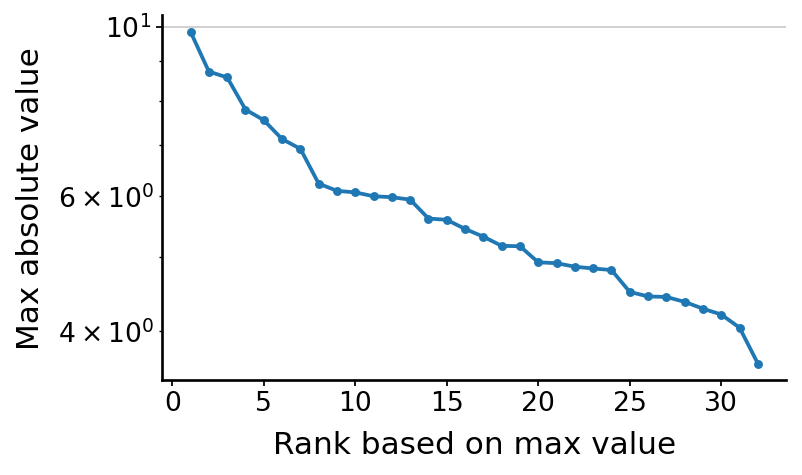

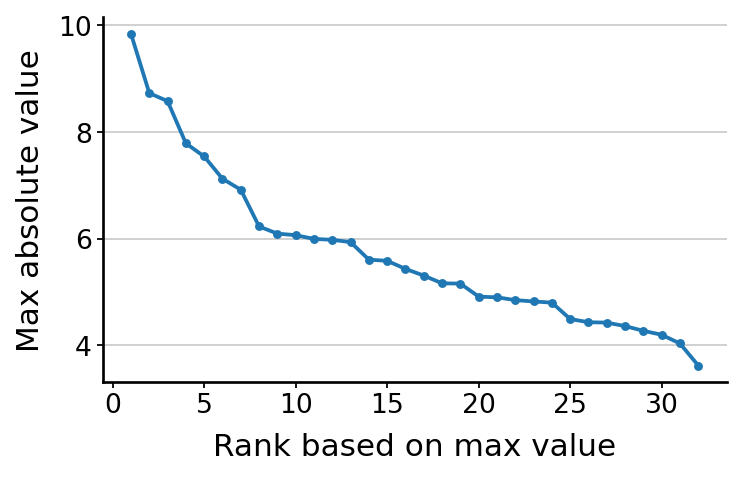

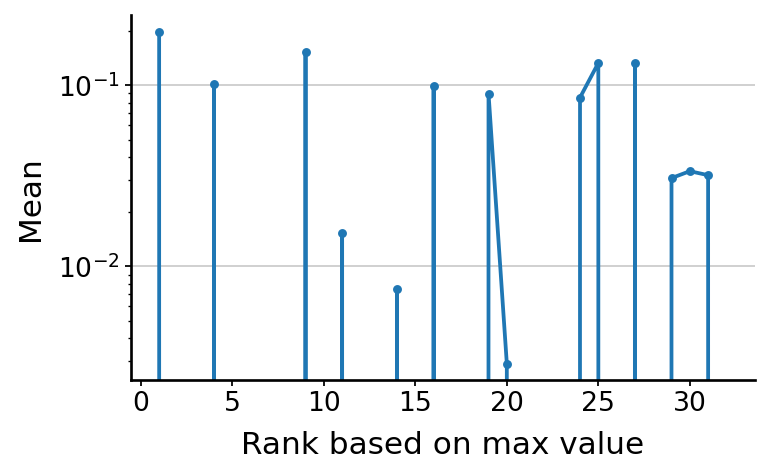

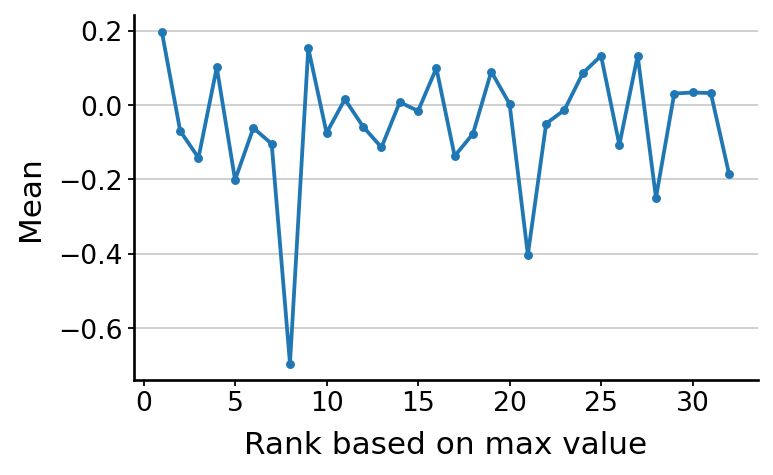

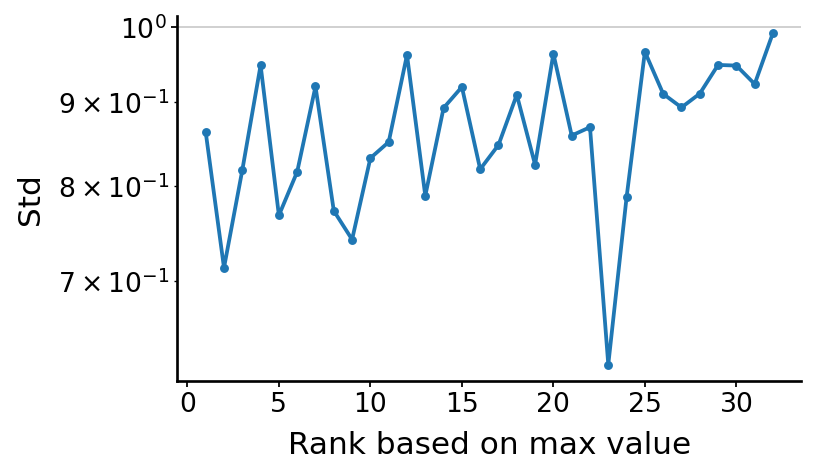

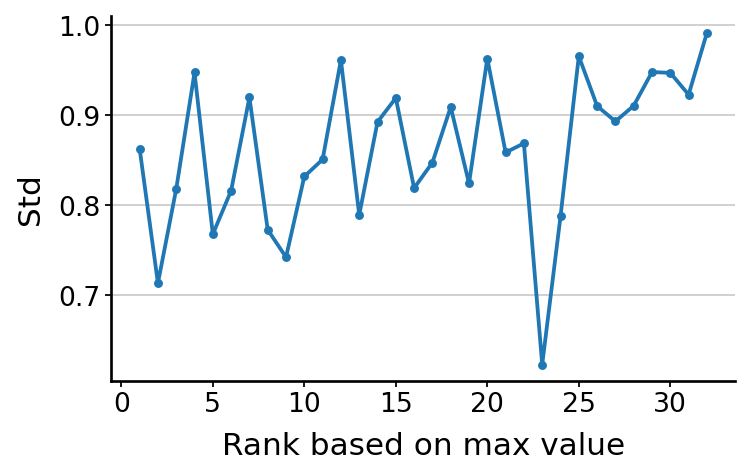

64 Dimensional


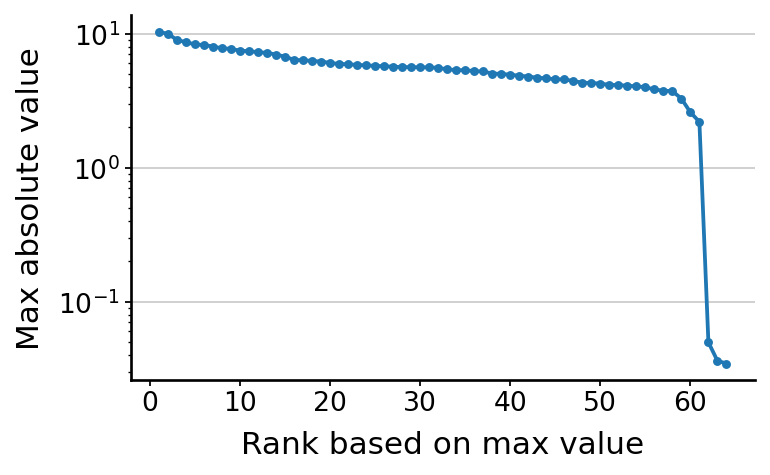

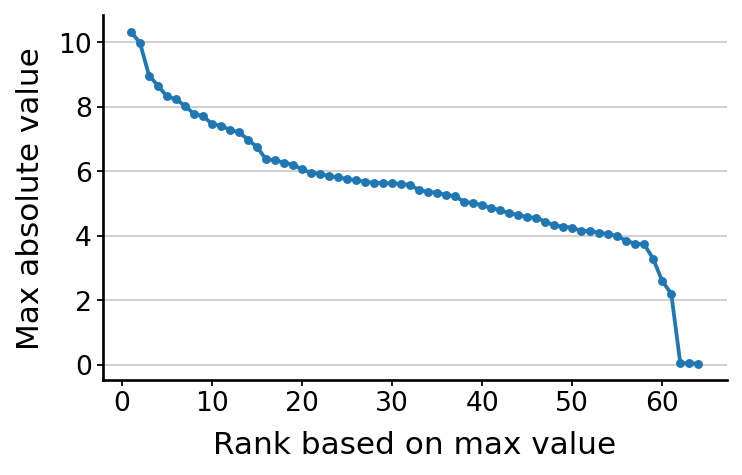

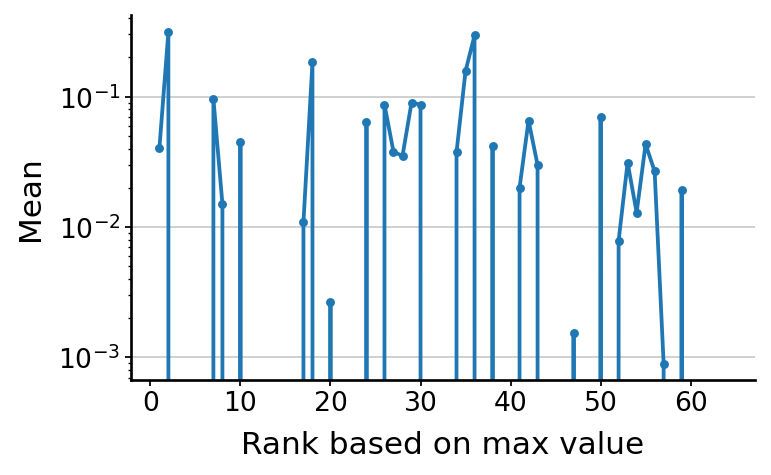

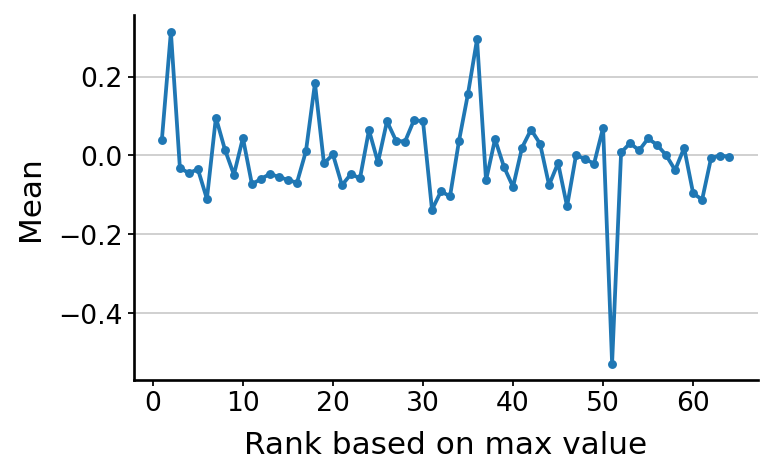

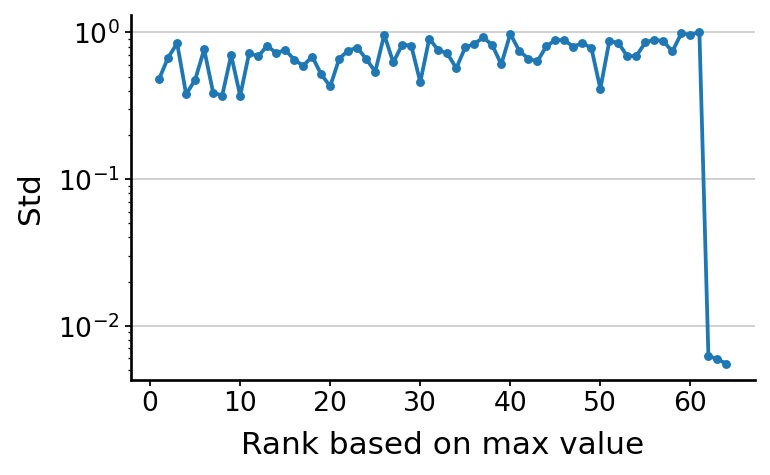

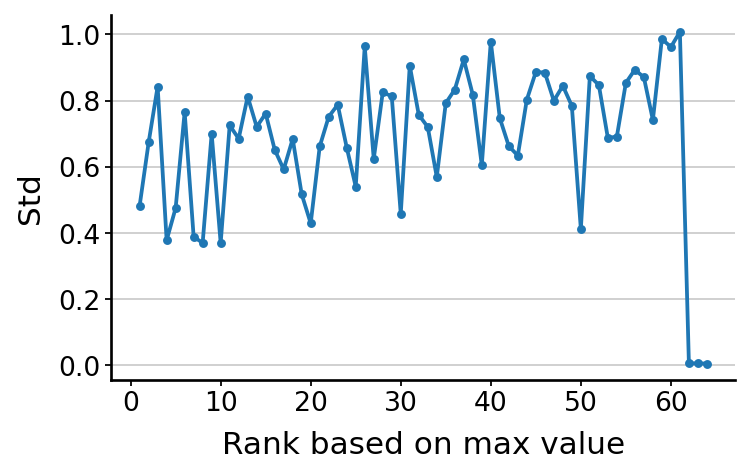

128 Dimensional


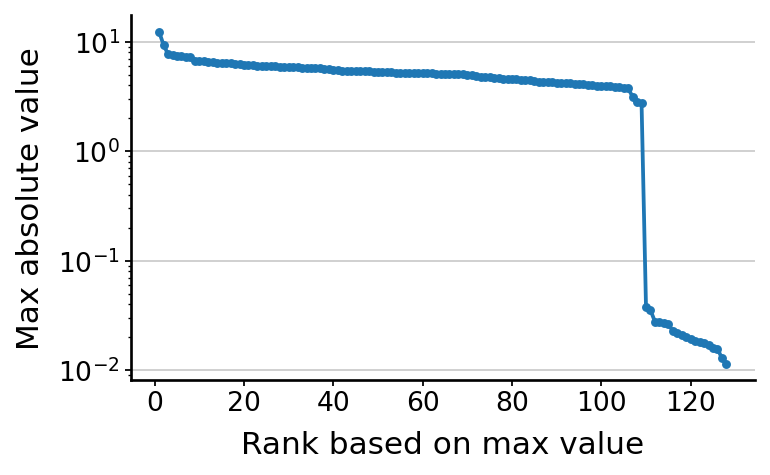

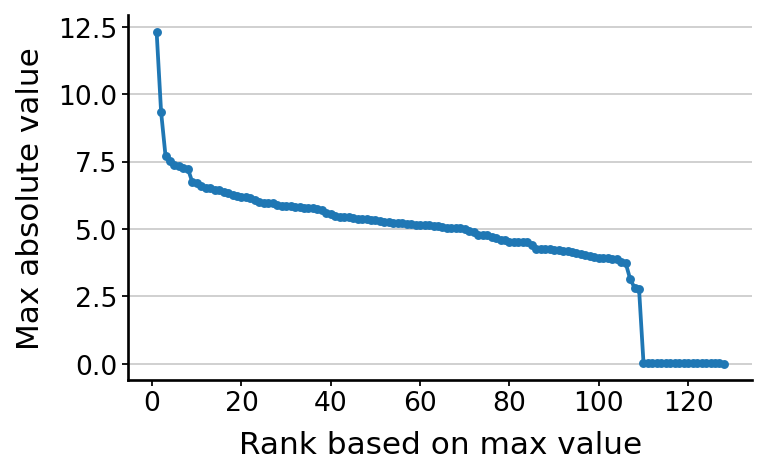

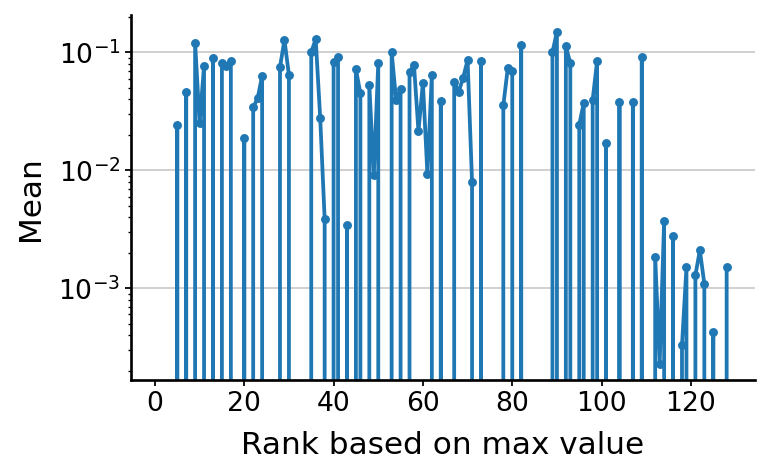

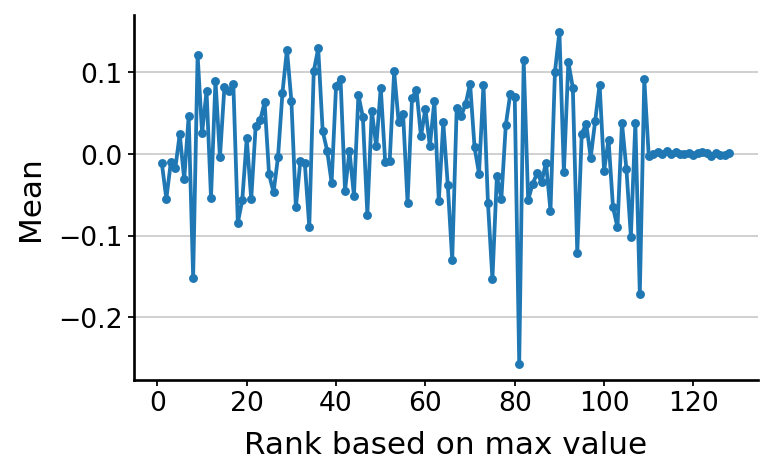

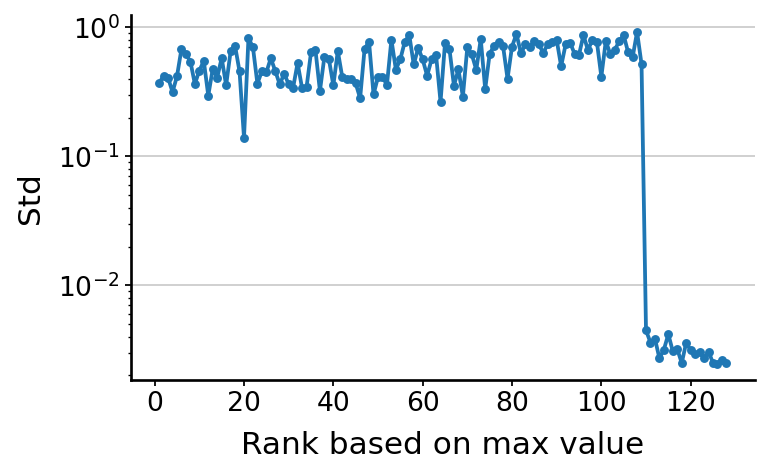

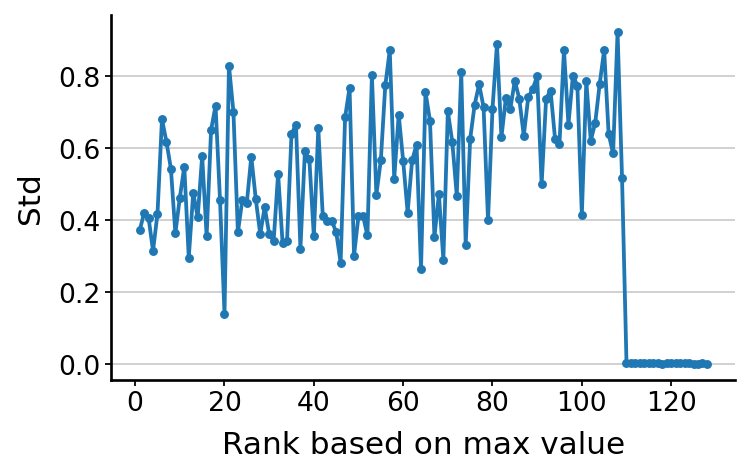

256 Dimensional


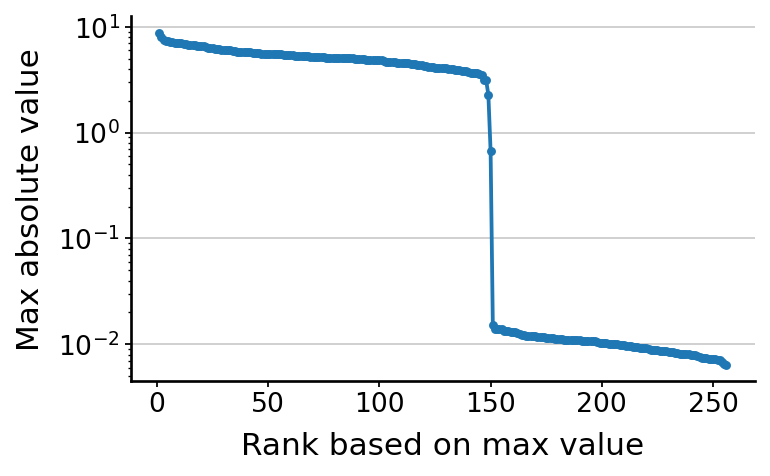

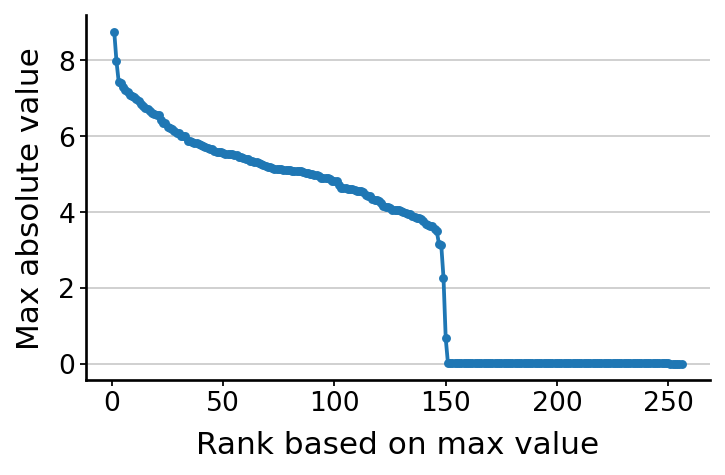

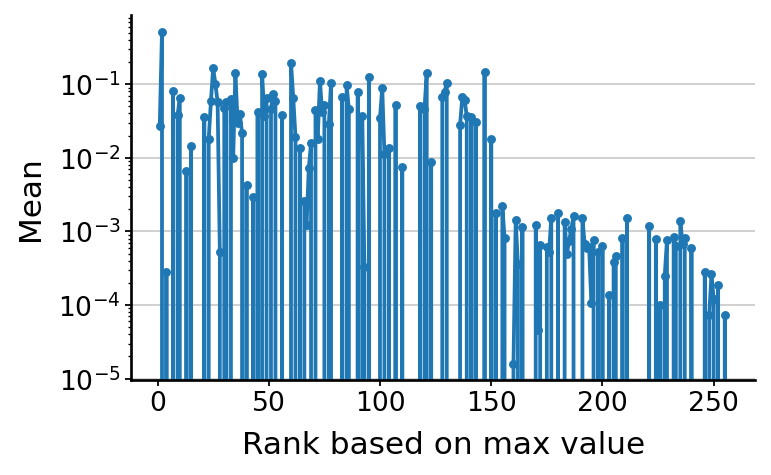

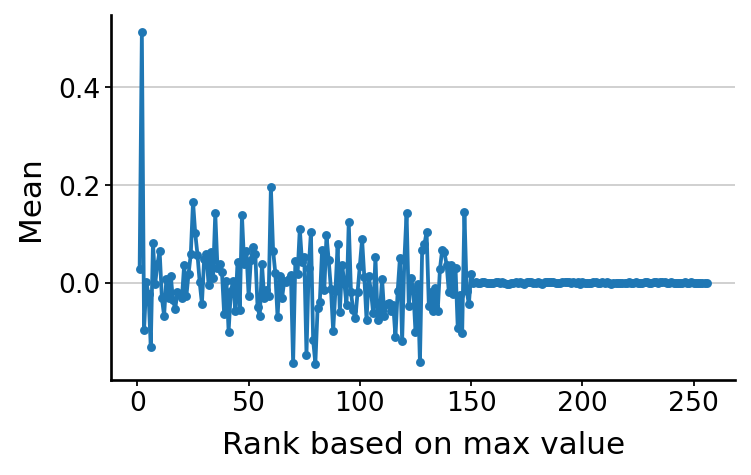

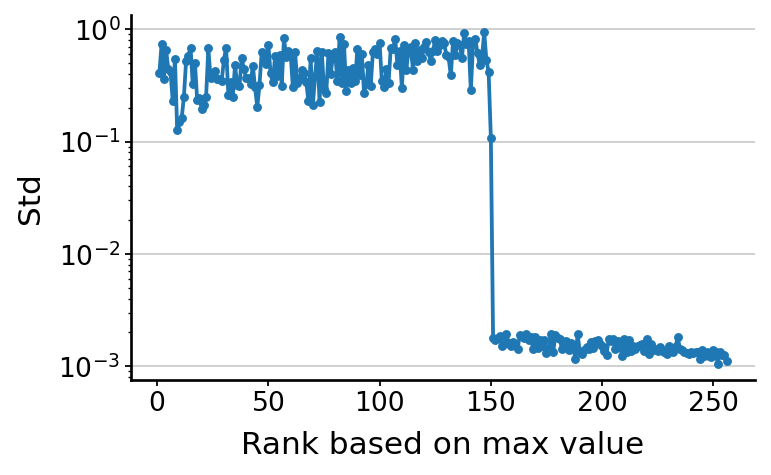

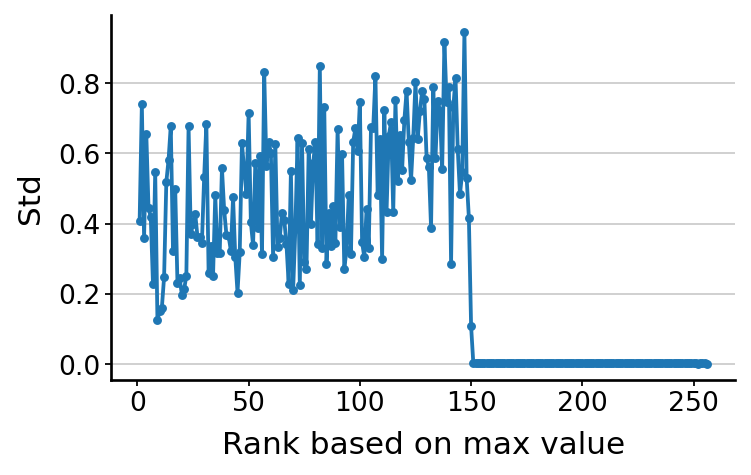

512 Dimensional


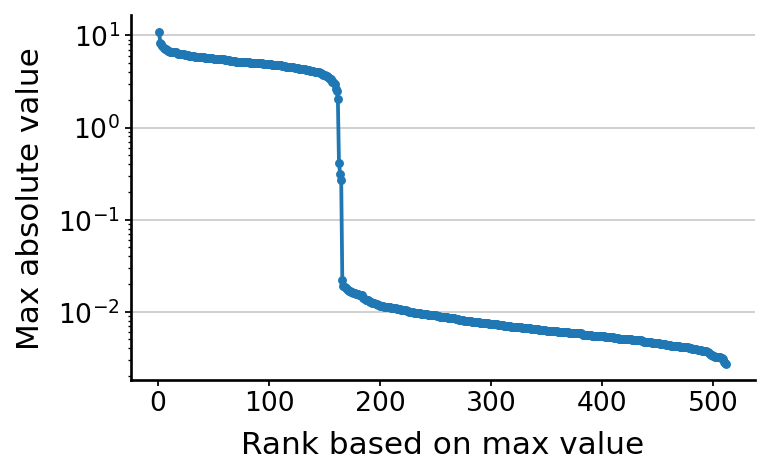

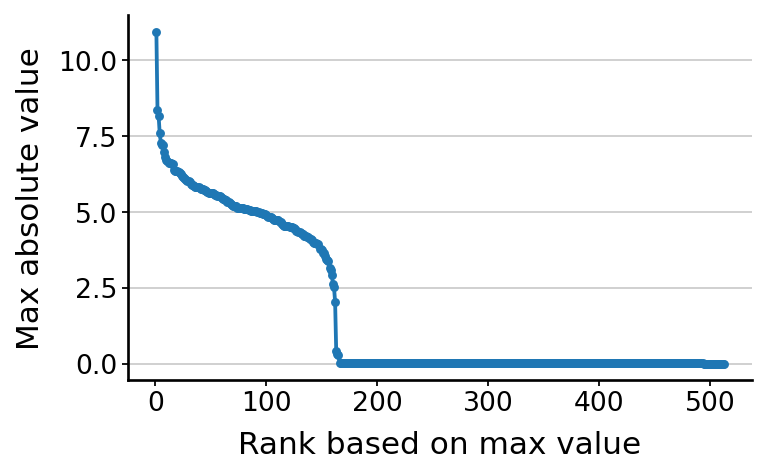

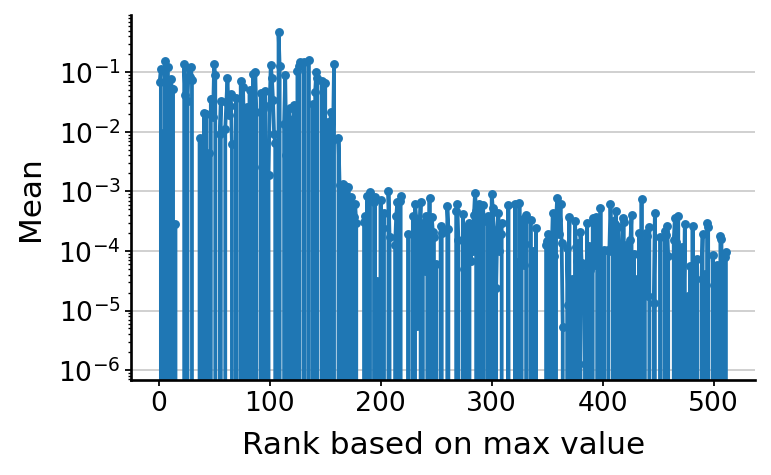

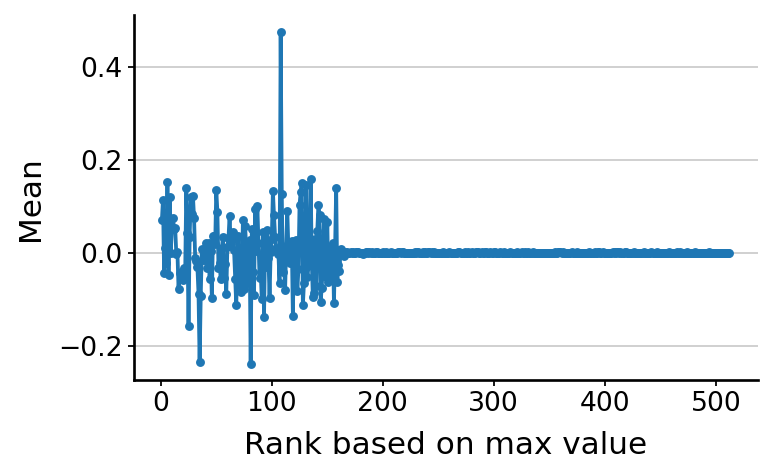

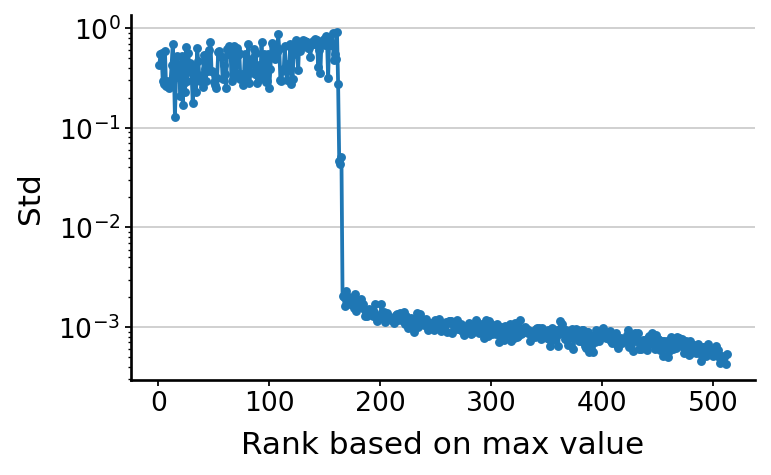

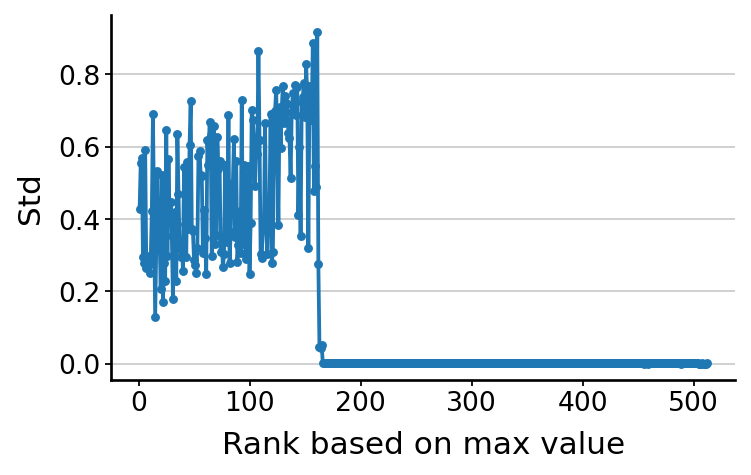

1024 Dimensional


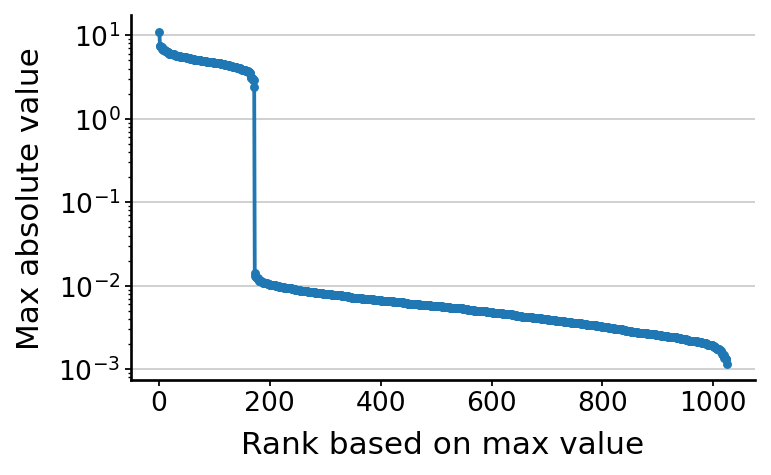

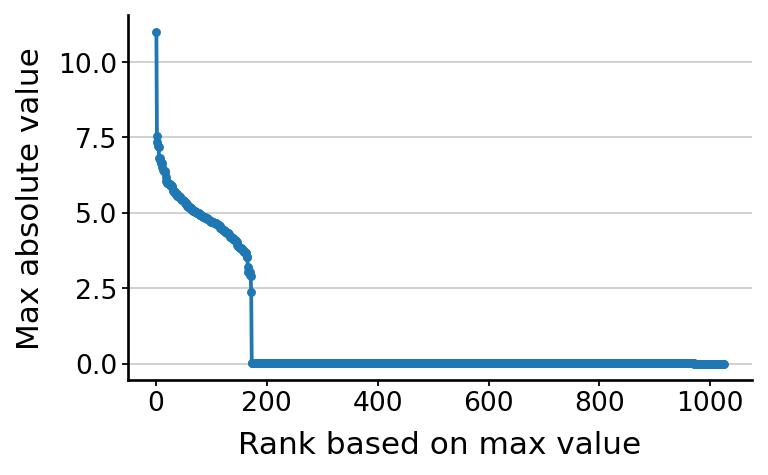

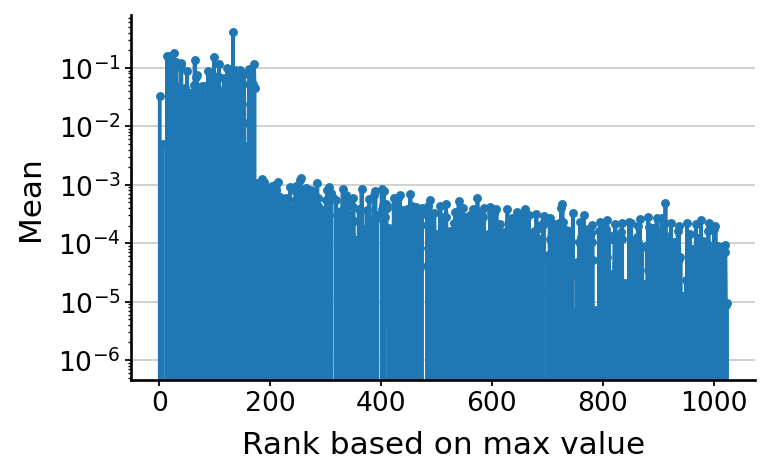

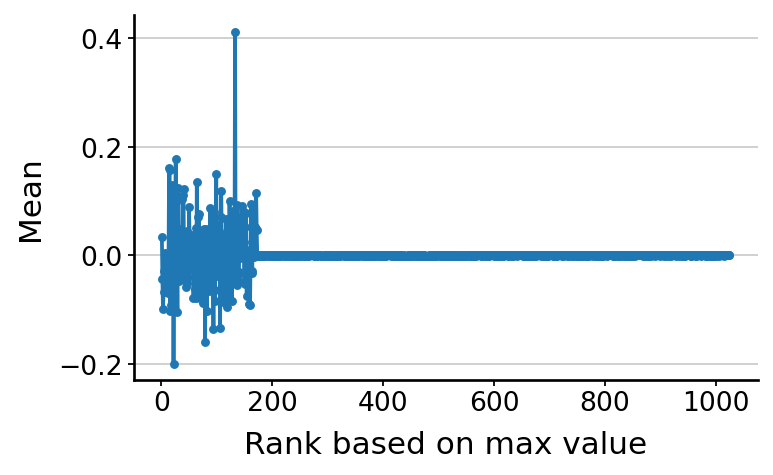

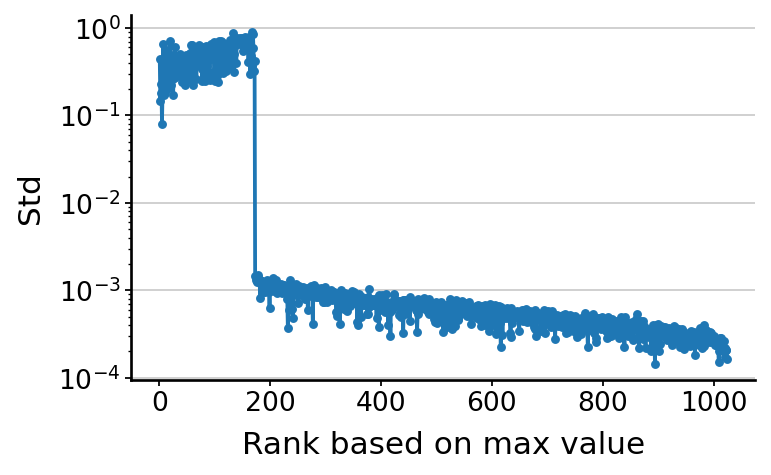

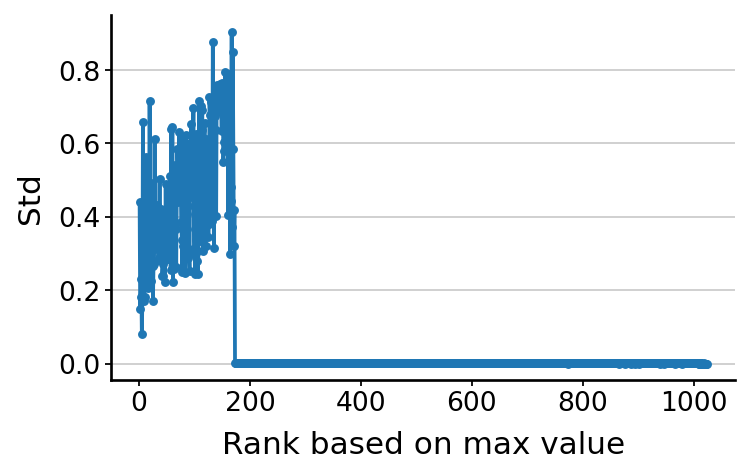

2048 Dimensional


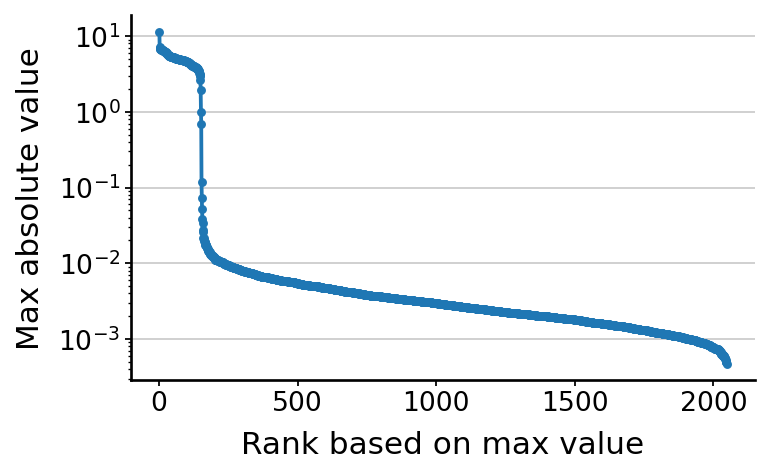

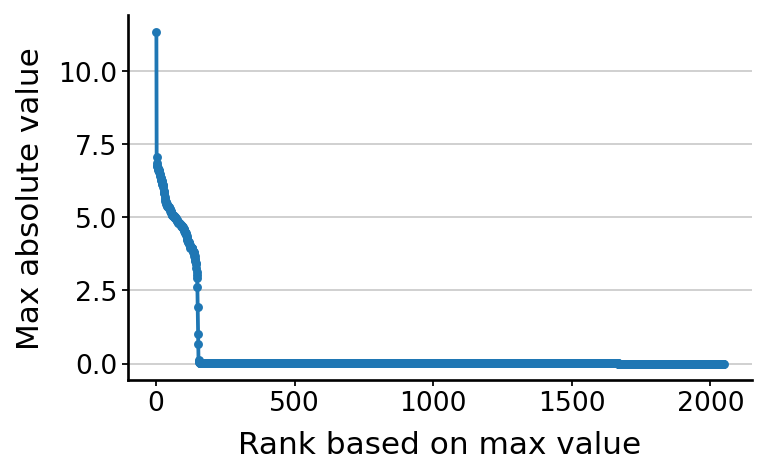

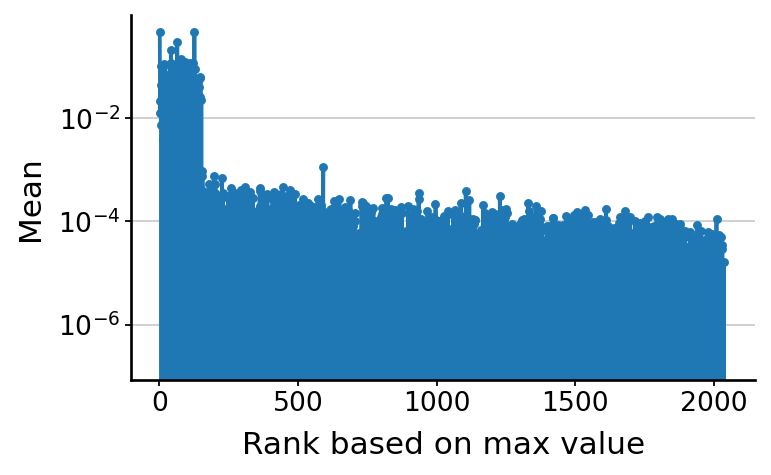

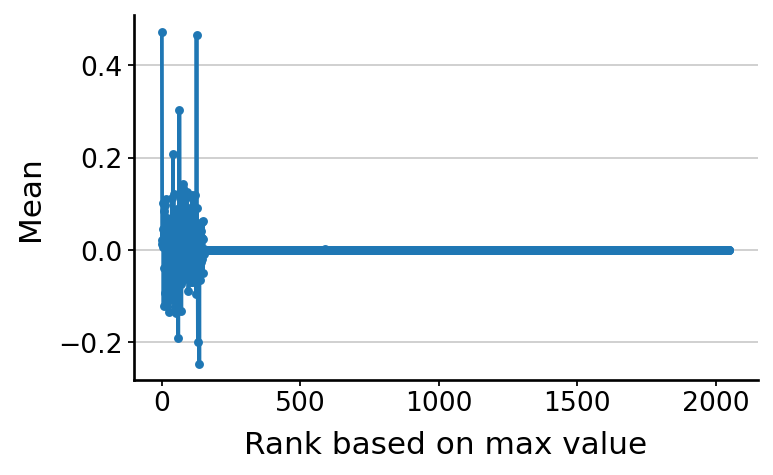

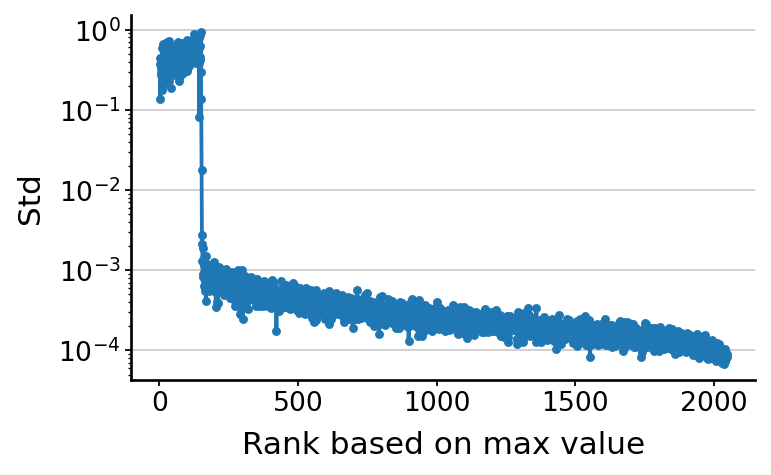

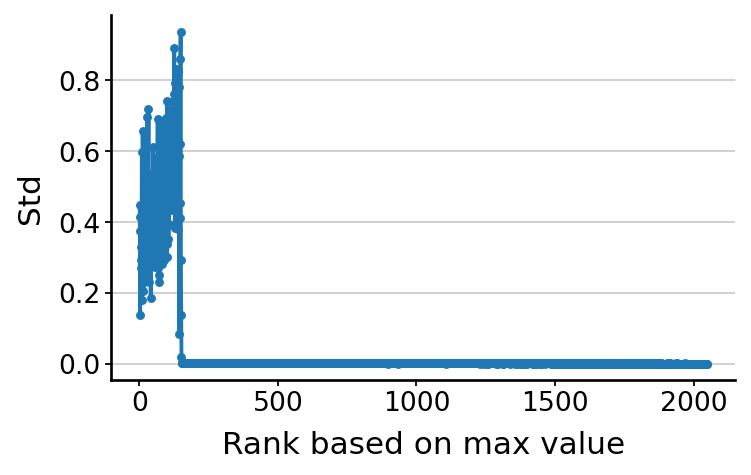

In [19]:
for method_name, embed in embeds.items():
    print(method_name)
    order = np.argsort(np.abs(embed.X).max(axis=0))[::-1]
    max_value_array = np.abs(embed.X).max(axis=0)[order]
    mean_array = embed.X.mean(axis=0)[order]
    std_array = embed.X.std(axis=0)[order]
    ranks = np.arange(1, embed.n_vars + 1)
    
    for y_axis_title, x in [
        ("Max absolute value", max_value_array),
        ("Mean", mean_array),
        ("Std", std_array),
    ]:
        for is_log in [True, False]:
            # Plotting the data
            plt.figure(figsize=(5, 3))
            plt.plot(ranks, x, 'o', markersize=3, color='#1F77B4', label='Data Points')  # Plot points
            plt.plot(ranks, x, linestyle='-', color='#1F77B4', label='Line')  # Solid line plot
        
            # Adding labels and title
            plt.xlabel('Rank based on max value')
            if is_log:
                plt.yscale('log')
            plt.ylabel(y_axis_title)
            
            # Adding a legend
            plt.legend().remove()
            
            # Displaying the plot
            plt.grid(axis='x')
            plt.savefig(proj_dir / 'plots' / 'immune_ablation_all_genes' / f'variable_vs_rank_based_on_max_{y_axis_title}{"_log" if is_log else ""}_{method_name}.pdf', bbox_inches='tight')
            plt.show()

In [20]:
def plot_based_on_n_latent(main_df, metric, metric_title, zero_center=True):
    # Plotting the data with specific x-axis labels
    plt.figure(figsize=(5, 3))
    split_point = 80, 35
    strech_factor = 5

    xticks_labels = []
    xticks_values = []
    for i, df in enumerate([main_df.query(f"n_latent < {split_point[0]}"), main_df.query(f"n_latent >= {split_point[1]}")]):
        x = df['n_latent']
        if i == 1:
            x = split_point[0] + (x - split_point[0]) / strech_factor
        plt.plot(x, df[metric], 'o', markersize=6, color='#1F77B4')  # Plot points
        plt.plot(x, df[metric], linestyle='--', color='#1F77B4')  # Dotted line plot
        
        # Setting labels and title
        plt.xlabel('Number of latent dimensions')
        plt.ylabel(metric_title)
    
        for i, val, label in zip(range(len(x)), x, df['n_latent']):
            if val > split_point[1] or i % 4 == 0 or i == len(x) - 1:
                xticks_values.append(val)
                xticks_labels.append(str(label))
    
    # Customizing x-axis ticks to show only some of the values in n_latent
    plt.xticks(xticks_values, xticks_labels, rotation=90)
    if zero_center:
        plt.ylim(ymin=0)
    
    # Adding vertical dotted lines for each n_latent value
    for val in xticks_values:
        plt.axvline(x=val, linestyle=':', color='grey', zorder=-10)
    
    # Add splitting lines
    plt.axvline(x=69, linestyle='-', color='black')
    plt.axvline(x=72, linestyle='-', color='black')
    
    # Displaying the plot
    plt.grid(False)
    return plt

In [21]:
embed_names_list = list(embeds.keys())
plot_df = pd.DataFrame(
    {
        'n_latent': [int(x.split(" ")[0]) for x in embed_names_list],
        'n_non_vanished': [(np.abs(embeds[x].X).max(axis=0) > 1).sum() for x in embed_names_list],
    }
)
plot_df.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
n_latent,2,4,6,8,10,12,14,16,32,64,128,256,512,1024,2048
n_non_vanished,2,4,6,8,10,12,14,16,32,61,109,149,162,172,151


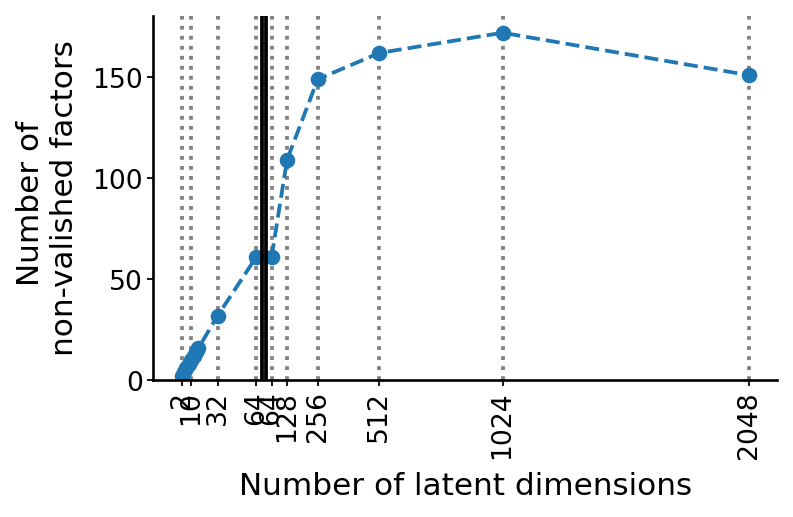

In [22]:
metric = 'n_non_vanished'
plt = plot_based_on_n_latent(plot_df.copy(), metric, 'Number of \nnon-valished factors')
plt.savefig(proj_dir / 'plots' / 'immune_ablation_all_genes' / f'{metric}_vs_n_latent.pdf', bbox_inches='tight')
plt.show()

# Disentanglement comparison

In [23]:
######################################
# Please run disentanglemnt notebook #
######################################

In [31]:
disentanglement_results_df = pd.read_csv(proj_dir / 'results' / f'eval_disentanglement_immune_all_hbw_ablation_all.csv', index_col=0)
disentanglement_results_df.columns = disentanglement_results_df.columns.str.replace('SMI-disc', 'SMI')
disentanglement_results_df

,Method,LMS-SMI,LMS-SPN,LMS-ASC,MSAS-SMI,MSAS-SPN,MSAS-ASC,MSGS-SMI,MSGS-SPN,MSGS-ASC
0,2 Dimensional,0.081121,0.084791,0.072469,0.396773,0.515316,0.211475,0.241862,0.415415,0.063949
1,4 Dimensional,0.142529,0.142768,0.105380,0.468217,0.517049,0.256896,0.272074,0.364070,0.104264
2,6 Dimensional,0.239880,0.239194,0.161861,0.544792,0.609328,0.304482,0.352100,0.455491,0.146018
3,8 Dimensional,0.285313,0.289387,0.197543,0.596773,0.614652,0.300318,0.365438,0.430630,0.094411
4,10 Dimensional,0.317398,0.334026,0.211271,0.544598,0.589604,0.291791,0.233725,0.307708,0.073476
5,12 Dimensional,0.394179,0.409918,0.232134,0.603103,0.613871,0.295798,0.248671,0.326849,0.062448
6,14 Dimensional,0.514082,0.489281,0.271399,0.690509,0.668748,0.314612,0.361458,0.359670,0.081985
7,16 Dimensional,0.495827,0.481513,0.281162,0.629720,0.631602,0.303088,0.342301,0.431015,0.064598
8,32 Dimensional,0.628562,0.606669,0.306735,0.667197,0.642335,0.307986,0.255943,0.276701,0.046933
9,64 Dimensional,0.701140,0.686798,0.305373,0.701140,0.686798,0.306208,0.224614,0.280574,0.039472


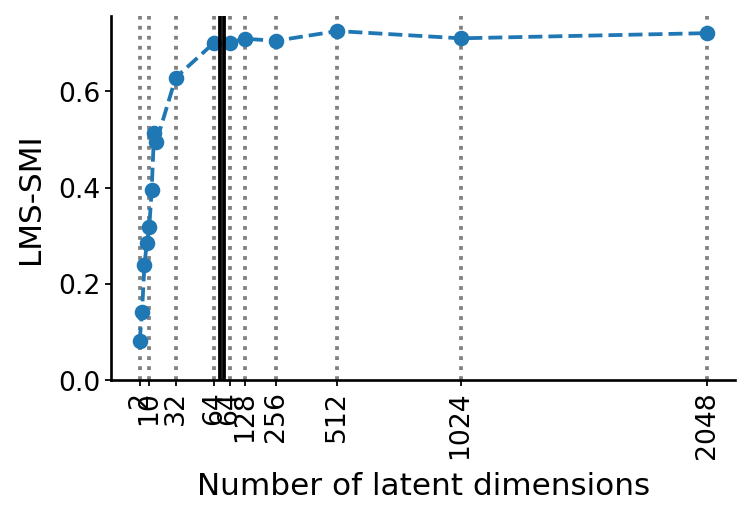

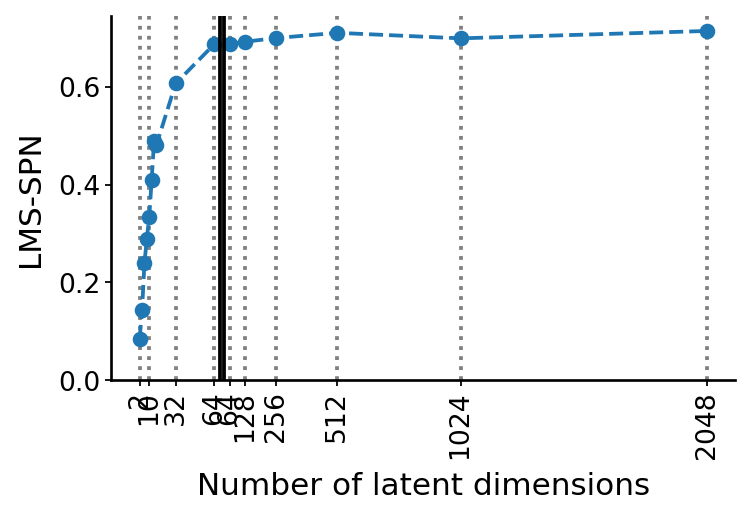

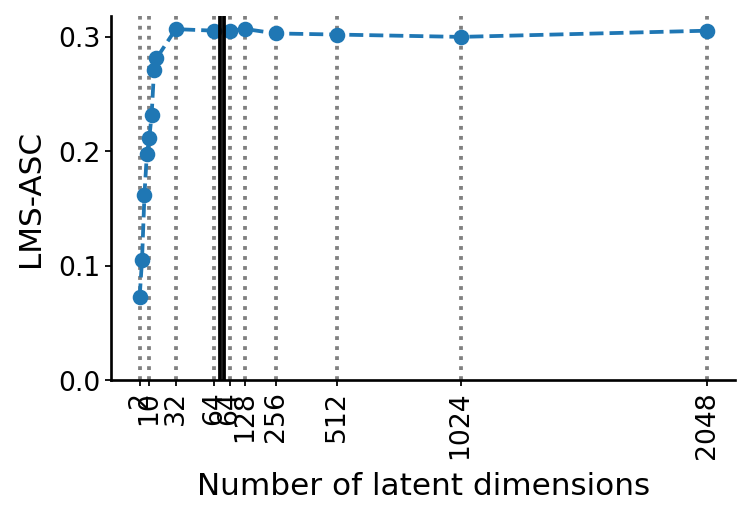

In [ ]:
df = disentanglement_results_df.copy()
df['n_latent'] = df['Method'].str.split(" ").str[0].astype(int)
df
for metric in df.columns:
    if "-" not in metric:
        continue

    plt = plot_based_on_n_latent(df.copy(), metric, metric)
    plt.savefig(proj_dir / 'plots' / 'immune_ablation' / f'{metric}_vs_n_latent.pdf', bbox_inches='tight')
    plt.show()

# Integrattion quality comparison

In [26]:
scib_results_address = proj_dir / 'results' / f'scib_results_immune_all_hbw_ablation.csv'
scib_df = pd.read_csv(scib_results_address, index_col=0).reset_index(names='method')
scib_df = scib_df[['method', 'Bio conservation', 'Batch correction', 'Total']]
scib_df['n_latent'] = scib_df['method'].str.split(" ").str[0].astype(int)
scib_df

,method,Bio conservation,Batch correction,Total,n_latent
0,2 Dimensional,0.619342,0.527380,0.582557,2
1,4 Dimensional,0.610861,0.570463,0.594702,4
2,6 Dimensional,0.628023,0.602796,0.617932,6
3,8 Dimensional,0.662364,0.605118,0.639466,8
4,10 Dimensional,0.615259,0.611692,0.613832,10
5,12 Dimensional,0.632888,0.626960,0.630517,12
6,14 Dimensional,0.645442,0.636183,0.641738,14
7,16 Dimensional,0.630296,0.636381,0.632730,16
8,32 Dimensional,0.637122,0.655229,0.644365,32
9,64 Dimensional,0.630851,0.664023,0.644120,64


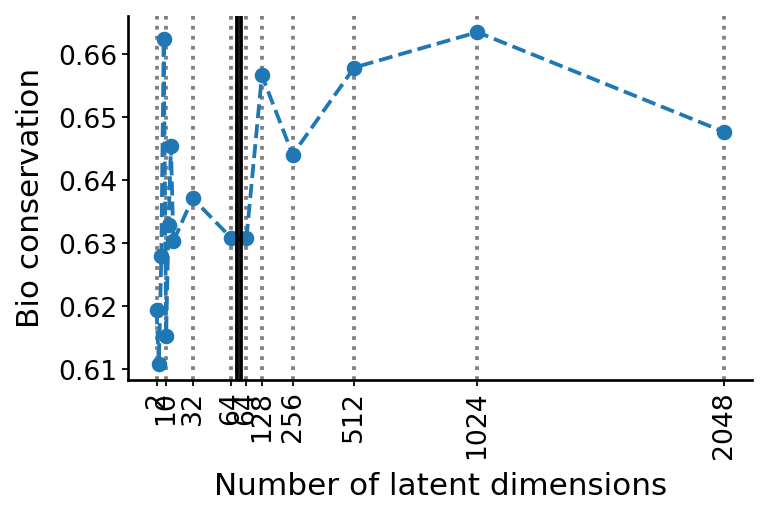

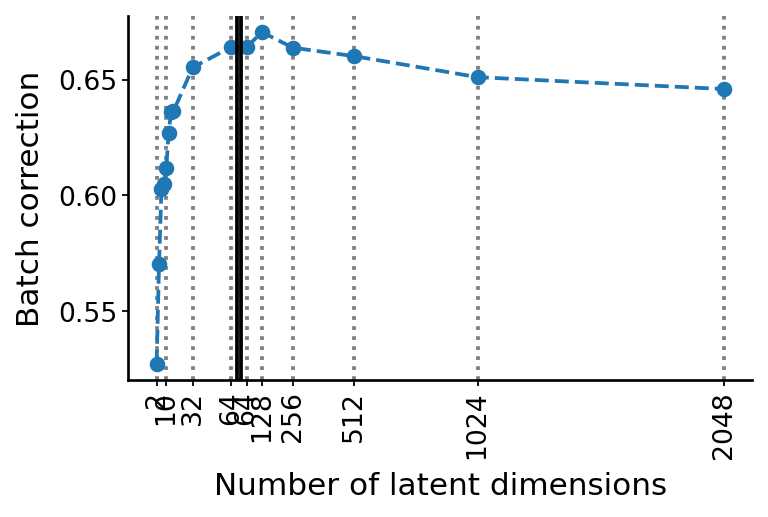

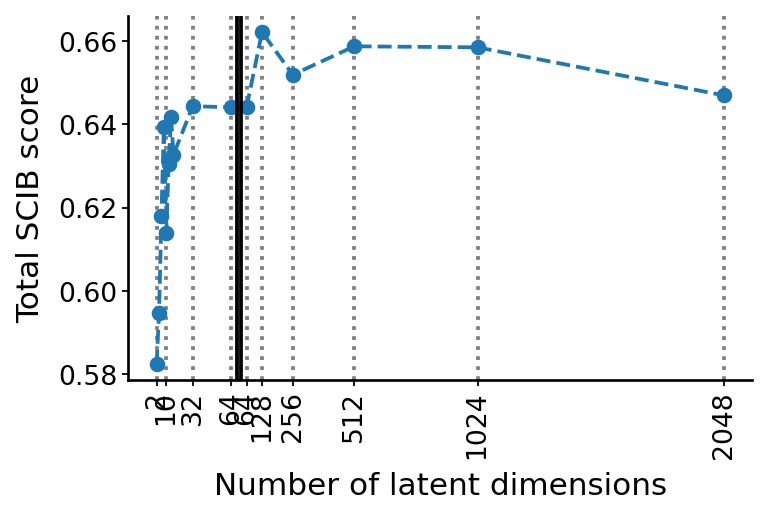

In [27]:
for metric in scib_df.columns:
    if metric in ['n_latent', 'method']:
        continue

    plt = plot_based_on_n_latent(scib_df.copy(), metric, metric, zero_center=False)
    prev_y = 0
    if metric == 'Total':
        plt.ylabel('Total SCIB score')
    plt.savefig(proj_dir / 'plots' / 'immune_ablation_all_genes' / f'scib_{metric}_vs_n_latent.pdf', bbox_inches='tight')
    plt.show()